# **Sensitivity analysis of selected single units with splitted input: AlexNet**

## **Navigation**

- [**Basic imports and initialization**](#Basic-imports-and-initialization)
- [**1. Sampling scheme 1: Summary statistics**](#1.-Sampling-scheme-1:-Summary-statistics)
- [**2. Sampling scheme 2: Summary statistics**](#2.-Sampling-scheme-2:-Summary-statistics)
- [**3. Aggregated summary statistics**](#3.-Aggregated-summary-statistics)
- [**4. Aggregated sensitivity values**](#4.-Aggregated-sensitivity-values)

# Basic imports and initialization

$\qquad$ [[Back to top]](#Navigation) $\qquad$ [[Next part $\to$]](#1.-Sampling-scheme-1:-Summary-statistics)

- [Setting up templates, limiting the hardware resources, importing packages](#Setting-up-templates,-limiting-the-hardware-resources,-importing-packages)
- [Initializing common variables](#Initializing-common-variables)
- [Configuring experiments and generating corresponding sh-files](#Configuring-experiments-and-generating-corresponding-sh-files)
    - [Sampling scheme 1: means and variances](#Sampling-scheme-1:-means-and-variances)
    - [Sampling scheme 1: Sobol indices](#Sampling-scheme-1:-Sobol-indices)
    - [Sampling scheme 2: Shapley values](#Sampling-scheme-2:-Shapley-values)

### Setting up templates, limiting the hardware resources, importing packages

$\quad$[[Back to section]](#Basic-imports-and-initialization)$\quad$[[Next subsect.$\to$]](#Initializing-common-variables)

Select the template of config files. ```base``` is a standard one, ```slurm``` is intended for using on the clusters with slurm working manangement installed.

In [1]:
sh_file_type = 'base'
libstdcpp_path = ''

In the case of problems with loading ```libstc++.so.6```, please provide the path to the library. In any other case, just ignore the following block.

In [2]:
import ctypes

if sh_file_type == 'base':
    libstdcpp_path = '/mnt/bulky/pkharyuk/apd/envs/activation_sense/lib/libstdc++.so.6'
else:
    raise ValueError

try:
    _stdcxx_lib = ctypes.cdll.LoadLibrary(libstdcpp_path)
except:
    pass

To provide easy access to modules stored in the ```../src/``` directory, we use the following workaround:

In [2]:
import sys
sys.path.append('../src/')

Next, we limit the hardware usage by setting the configuration dictionaries, maximum number of threads (and computing processes in the case of using the ```slurm```):

In [3]:
# set limitations on hardware
# fill on the template's config
import hardware_setup
hardware_setup.mkl_set_num_threads(num_threads=4)

# note about device: concerns only the inference of network
# all other operations including batch preprocessing will be performed
# on cpu only.

device = 'cpu' # 'cuda:0'
#device = 'cuda' if torch.cuda.is_available() else 'cpu'

if sh_file_type == 'base':
    mkl_num_threads = 5
    n_computing_processes = 4
else:
    raise ValueError

[mkl]: set up num_threads=4/4


Then we import all necessary packages:

In [4]:
import os
import copy

import sensitivity_analysis.augmentation_setting
import sensitivity_analysis.visualize
import sensitivity_analysis.preprocess_visualize

import preparation.single_unit
import preparation.visualize

import exp_assistance

import matplotlib.pyplot as plt
%matplotlib inline

### Initializing common variables

[[$\leftarrow$Prev.subsect.]](#Setting-up-templates,-limiting-the-hardware-resources,-importing-packages)$\quad$[[Back to section]](#Basic-imports-and-initialization)$\quad$[[Next subsect.$\to$]](#Configuring-experiments-and-generating-corresponding-sh-files)

In [5]:
data_dirname = '../data/imagenet'
activations_dirname = '../results/single_unit'
model_dirname = '../torch-models/'
exp_relative_path = '../experiments/'

network_name = 'alexnet'
json_config_path = './alexnet_single_units.json'
values_fnm_base = 'imagenet_ILSVRC_values_selected_single_units'

ncols_orig = 8
augmentation_set_numbers_list = [1, 2]

desired_image_height = 224
desired_image_width = 224

In [6]:
values_fnms_dict = preparation.single_unit.extract_channeled_single_units_values_fnms(
    network_name,
    values_fnm_base,
    augmentation_set_numbers_list,
    channels=preparation.single_unit._HSVG_channel_names
);

values_filter_keys = ['cs', 'shptv']

for key in values_fnms_dict:
    for sub_key in values_filter_keys:
        del values_fnms_dict[key][sub_key]

In [8]:
analysis_config_list = preparation.single_unit.load_config_from_json(json_config_path)
analysis_config_list = preparation.single_unit.extract_neuron_indices(analysis_config_list)

network_module_names = list(
    map(
        #lambda x: x['unit_name'], config_list
        lambda x: f"modules_dict.{x['unit_name']}.{len(x['modules_names'])-1}",
        analysis_config_list
    )
)

basic_config_dict = {
    'batch_size_activations_computing': 500, #125 #x4 = 500 #
    # 1000 classes; minimal number of samples/per class: 732
    'samples_per_class_train': 732, #
    'samples_per_class_valid': 50, #
    'data_dirname': data_dirname, #
    'activations_dirname': activations_dirname, #
    'model_dirname': model_dirname, #
    'dataset_part': 'train+valid', #
    'mkl_num_threads': mkl_num_threads, #
    'device': device, #
    'augset1_p': 0.5, #
    'augset2_p': 0.5, #
    'remove_activations_hdf5': 0, #
    'desired_image_height': desired_image_height, #
    'desired_image_width': desired_image_width, #
    'network_name': network_name, #
    'json_config_path': os.path.join('./', json_config_path),
}

if len(libstdcpp_path) > 0:
    basic_config_dict['libstdcpp_path'] = libstdcpp_path

### Configuring experiments and generating corresponding sh-files

[[$\leftarrow$Prev.subsect.]](#Initializing-common-variables)$\quad$[[Back to section]](#Basic-imports-and-initialization)$\quad$

- [Sampling scheme 1: means and variances](#Sampling-scheme-1:-means-and-variances)
- [Sampling scheme 1: Sobol indices](#Sampling-scheme-1:-Sobol-indices)
- [Sampling scheme 2: Shapley values](#Sampling-scheme-2:-Shapley-values)


```Config_dict``` variables accumulate all necessary parameters used in the corresponding experiments. The first block fills the ```config_dict```, the second generates ```sh```-file to be run in the terminal.

#### Sampling scheme 1: means and variances

[[Back to subsection]](#Configuring-experiments-and-generating-corresponding-sh-files)

In [9]:
# 2.2
config_dict_exp2_2 = copy.deepcopy(basic_config_dict)

config_dict_exp2_2['buffer_size_tv_computing'] = 5000 #
config_dict_exp2_2['subset_random_state_train'] = 753 #
config_dict_exp2_2['subset_random_state_valid'] = 755 #
config_dict_exp2_2['torch_seed'] = 817 #
config_dict_exp2_2['numpy_seed'] = 715 #
config_dict_exp2_2['class_sampler_seed'] = 232 #
config_dict_exp2_2['Njobs_tv_computing'] = n_computing_processes #
config_dict_exp2_2['activations_fnm_prefix'] = (
    f'sitv_{network_name}_imagenet_ILSVRC_activations_selected_single_units' #
)
config_dict_exp2_2['values_fnm_prefix'] = (
    f'sitv_{network_name}_imagenet_ILSVRC_values_selected_single_units' #
)
config_dict_exp2_2['Nsamples'] = 2**13 #
config_dict_exp2_2['compute_s2'] = 1 #
config_dict_exp2_2['recompute_activations'] = 0 #
config_dict_exp2_2['use_permutation_variable'] = 1 #
config_dict_exp2_2['use_switch_variables'] = 0 #
config_dict_exp2_2['use_partition_variable'] = 1 #

In [10]:
####################################################################################
script_filename_base = 'script_exp2.2'
exp_filename = '2.2_selected_units_imagenet_si_variance.py'
exp_script_path = os.path.join(exp_relative_path, exp_filename)
for augmentation_set_number in [1, 2]:
    config_dict_exp2_2['augmentation_set_number'] = augmentation_set_number
    current_script_filename = f'{script_filename_base}_aug={augmentation_set_number}.sh'
    exp_assistance.build_sh_exp_files(
        config_dict_exp2_2,
        current_script_filename,
        exp_script_path,
        which=sh_file_type,
    );

#### Sampling scheme 1: Sobol indices

[[Back to subsection]](#Configuring-experiments-and-generating-corresponding-sh-files)

In [11]:
# 2.3
config_dict_exp2_3 = copy.deepcopy(basic_config_dict)

config_dict_exp2_3['buffer_size_si_computing'] = 500 #
config_dict_exp2_3['torch_seed'] = 817 #
config_dict_exp2_3['numpy_seed'] = 715 #
config_dict_exp2_3['si_analyze_random_state'] = 323 #
config_dict_exp2_3['class_sampler_seed'] = 232 #
config_dict_exp2_3['subset_random_state_train'] = 753 #
config_dict_exp2_3['subset_random_state_valid'] = 755 #
config_dict_exp2_3['Nsamples'] = 2**13 #
config_dict_exp2_3['Njobs_si_computing'] = n_computing_processes #
config_dict_exp2_3['use_permutation_variable'] = 1 #
config_dict_exp2_3['use_switch_variables'] = 0 #
config_dict_exp2_3['compute_s2'] = 1 ####
config_dict_exp2_3['recompute_activations'] = 0 #
config_dict_exp2_3['activations_fnm_prefix'] = (
    f'sitv_{network_name}_imagenet_ILSVRC_activations_selected_single_units'
)
config_dict_exp2_3['values_fnm_prefix'] = (
    f'si_{network_name}_imagenet_ILSVRC_values_selected_single_units'
)
config_dict_exp2_3['use_partition_variable'] = 1 #
config_dict_exp2_3['n_proc'] = 1 #

In [12]:
####################################################################################
script_filename_base = 'script_exp2.3'
exp_filename = '2.3_selected_units_imagenet_sobol.py'
exp_script_path = os.path.join(exp_relative_path, exp_filename)
for augmentation_set_number in [1, 2]:
    config_dict_exp2_3['augmentation_set_number'] = augmentation_set_number
    current_script_filename = f'{script_filename_base}_aug={augmentation_set_number}.sh'
    exp_assistance.build_sh_exp_files(
        config_dict_exp2_3,
        current_script_filename,
        exp_script_path,
        which=sh_file_type,
    );

#### Sampling scheme 2: Shapley values

[[Back to subsection]](#Configuring-experiments-and-generating-corresponding-sh-files)

Please note that variances can be estimated by summing up all shapley values.

In [13]:
# exp 2.5

config_dict_exp2_5 = copy.deepcopy(basic_config_dict)

config_dict_exp2_5['buffer_size_shpv_computing'] = 5000
config_dict_exp2_5['torch_seed'] = 817
config_dict_exp2_5['numpy_seed'] = 715
config_dict_exp2_5['class_sampler_seed'] = 512
config_dict_exp2_5['subset_random_state_train'] = 753
config_dict_exp2_5['subset_random_state_valid'] = 755
config_dict_exp2_5['Njobs_shpv_computing'] = 8#n_computing_processes
config_dict_exp2_5['activations_fnm_prefix'] = (
    f'shpv_{network_name}_imagenet_ILSVRC_activations_selected_single_units' #'
)
config_dict_exp2_5['values_fnm_prefix'] = (
    f'shpv_{network_name}_imagenet_ILSVRC_values_selected_single_units' #'
)
config_dict_exp2_5['Nouter_samples'] = 2**3
config_dict_exp2_5['Ninner_samples'] = 2**3
config_dict_exp2_5['Npermutations'] = 2**7
config_dict_exp2_5['permutation_random_seed'] = 256
config_dict_exp2_5['problem_sampler_seed'] = 128
config_dict_exp2_5['use_partition_variable'] = 1
config_dict_exp2_5['use_permutation_variable'] = 1
config_dict_exp2_5['class_selector_seed'] = 200
config_dict_exp2_5['partition_sampler_seed'] = 255
config_dict_exp2_5['recompute_activations'] = 0

In [14]:
####################################################################################
script_filename_base = 'script_exp2.5'
exp_filename = '2.5_selected_units_imagenet_shapley.py'
exp_script_path = os.path.join(exp_relative_path, exp_filename)
for augmentation_set_number in [1, 2]:
    config_dict_exp2_5['augmentation_set_number'] = augmentation_set_number
    current_script_filename = f'{script_filename_base}_aug={augmentation_set_number}.sh'
    
    exp_assistance.build_sh_exp_files(
        config_dict_exp2_5,
        current_script_filename,
        exp_script_path,
        which=sh_file_type,
    );

## 1. Sampling scheme 1: Summary statistics

[[$\leftarrow$ Prev.part]](#Basic-imports-and-initialization) $\qquad$ [[Back to top]](#Navigation) $\qquad$ [[Next part $\to$]](#2.-Sampling-scheme-2:-Summary-statistics)

- [1.1 Evaluating variables needed to plot the results](#1.1-Evaluating-variables-needed-to-plot-the-results)
- [1.2 Log-transformed (modules of) mean values](#1.2-Log-transformed-(modules-of)-mean-values)
    - [1.2.1 Augmentation set #1](#1.2.1-Augmentation-set-#1)
    - [1.2.2 Augmentation set #2](#1.2.2-Augmentation-set-#2)
- [1.3 Log-transformed total variances](#1.3-Log-transformed-total-variances)
    - [1.3.1 Augmentation set #1](#1.3.1-Augmentation-set-#1)
    - [1.3.2 Augmentation set #2](#1.3.2-Augmentation-set-#2)
- [1.4 Log-transformed Coefficients of Variance](#1.4-Log-transformed-Coefficients-of-Variance)
    - [1.4.1 Augmentation set #1](#1.4.1-Augmentation-set-#1)
    - [1.4.2 Augmentation set #2](#1.4.2-Augmentation-set-#2)


### 1.1 Evaluating variables needed to plot the results

$\quad$[[Back to section]](#1.-Sampling-scheme-1:-Summary-statistics)$\quad$[[Next subsect.$\to$]](#1.2-Log-transformed-(modules-of)-mean-values)

It is supposed that one has already run all necessary experiments and obtained the corresponding results.

In [667]:
local_params_dict_1 = {
    'values_fnm_prefix': config_dict_exp2_2["values_fnm_prefix"],
    'activations_dirname': activations_dirname,
    'dataset_part': config_dict_exp2_2["dataset_part"],
    'config_list': analysis_config_list,
    #'module_names': network_module_names,
    'ncols_max': 16,
    'ncols_orig': 8,
    'fig': None,
    'figsize': (20, 8),
    #gs=None,
    #gs_size=None,
    'show': True,
    'cmap': 'Reds',
    'vmin': 0,
    'vmax': None
}

### 1.2 Log-transformed (modules of) mean values

[[$\leftarrow$Prev.subsect.]](#1.1-Evaluating-variables-needed-to-plot-the-results)$\quad$[[Back to section]](#1.-Sampling-scheme-1:-Summary-statistics)$\quad$[[Next subsect.$\to$]](#1.3-Log-transformed-total-variances)

- [1.2.1 Augmentation set #1](#1.2.1-Augmentation-set-#1)
- [1.2.2 Augmentation set #2](#1.2.2-Augmentation-set-#2)

#### 1.2.1 Augmentation set #1

[[Back to subsection]](#1.2-Log-transformed-(modules-of)-mean-values)

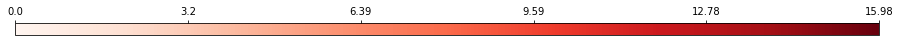

modules_dict.features2.2


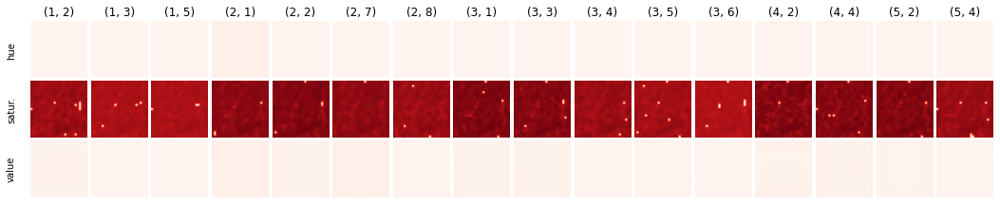

modules_dict.features5.2


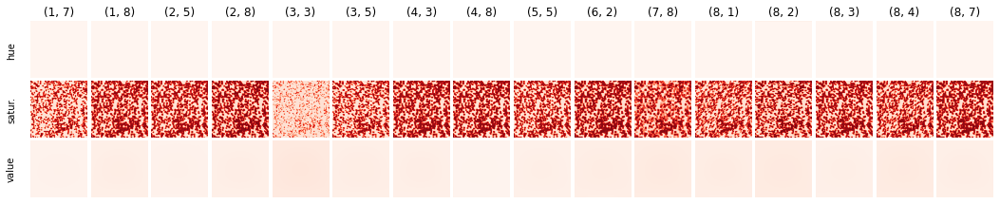

modules_dict.features7.1


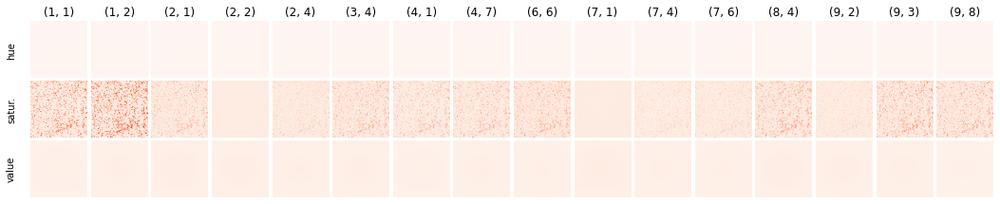

modules_dict.features9.1


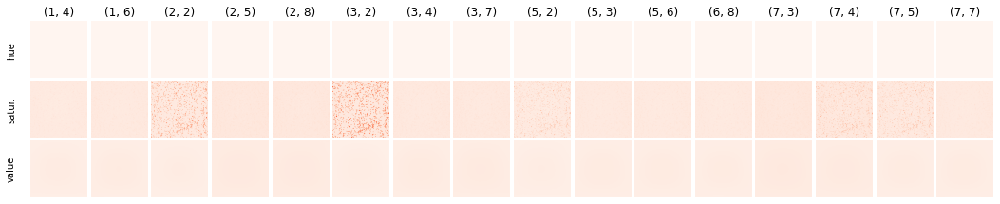

modules_dict.avgpool.3


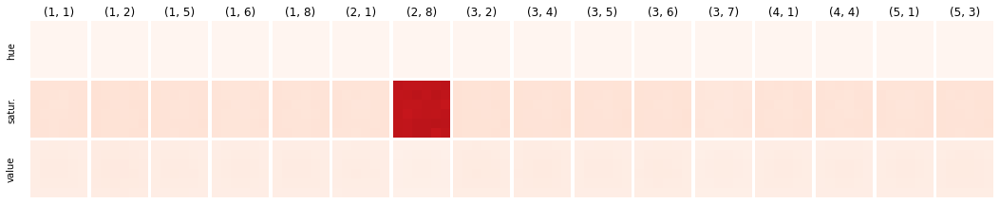

In [670]:
augmentation_set_number = 1

preparation.visualize.single_neuron_single_values_channeled_plot(
    augmentation_set_number=augmentation_set_number,
    values_name='mean',
    values_func=sensitivity_analysis.preprocess_visualize.log_scale,
    **local_params_dict_1,
);

#### 1.2.2 Augmentation set #2

[[Back to subsection]](#1.2-Log-transformed-(modules-of)-mean-values)

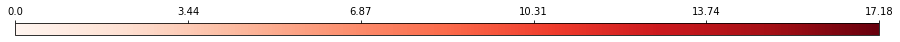

modules_dict.features2.2


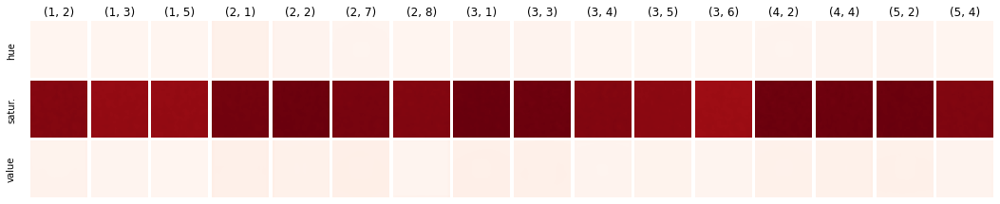

modules_dict.features5.2


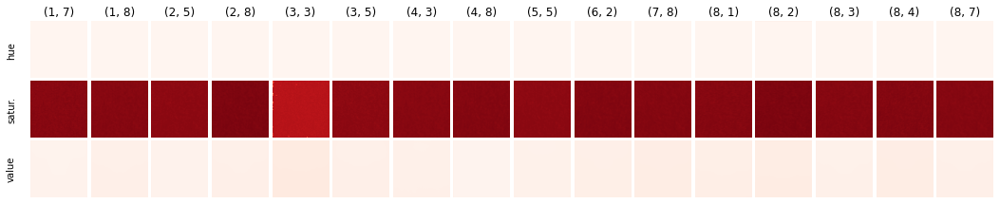

modules_dict.features7.1


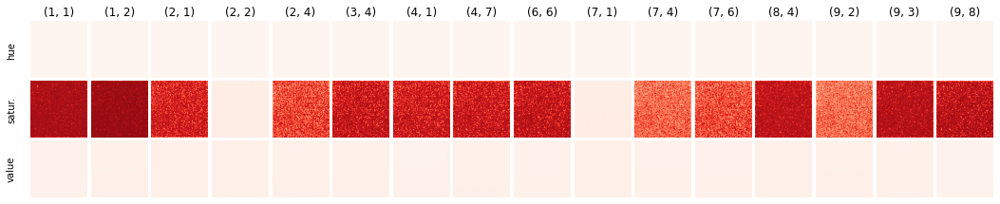

modules_dict.features9.1


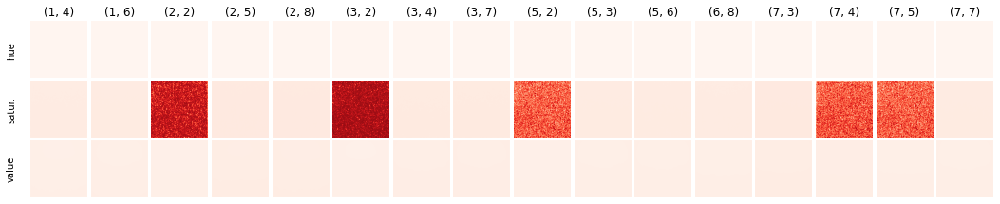

modules_dict.avgpool.3


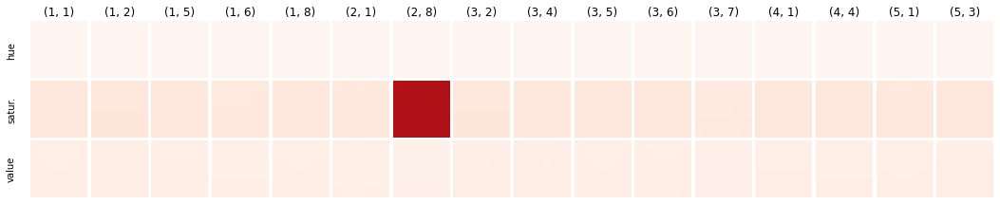

In [671]:
augmentation_set_number = 2

preparation.visualize.single_neuron_single_values_channeled_plot(
augmentation_set_number=augmentation_set_number,
    values_name='mean',
    values_func=sensitivity_analysis.preprocess_visualize.log_scale,
    **local_params_dict_1,
);

### 1.3 Log-transformed total variances

[[$\leftarrow$Prev.subsect.]](#1.2-Log-transformed-(modules-of)-mean-values)$\quad$[[Back to section]](#1.-Sampling-scheme-1:-Summary-statistics)$\quad$[[Next subsect.$\to$]](#1.4-Log-transformed-Coefficients-of-Variance)

- [1.3.1 Augmentation set #1](#1.3.1-Augmentation-set-#1)
- [1.3.2 Augmentation set #2](#1.3.2-Augmentation-set-#2)

#### 1.3.1 Augmentation set #1

[[Back to subsection]](#1.3-Log-transformed-total-variances)

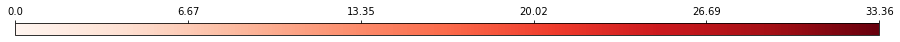

modules_dict.features2.2


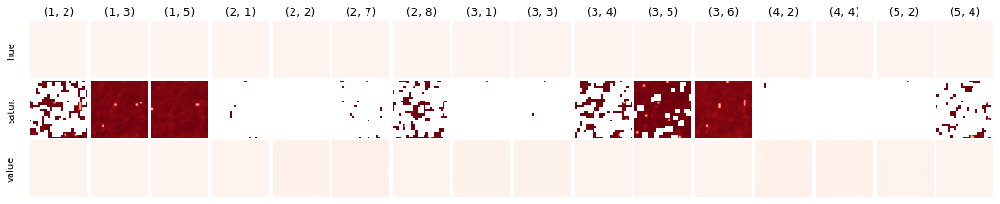

modules_dict.features5.2


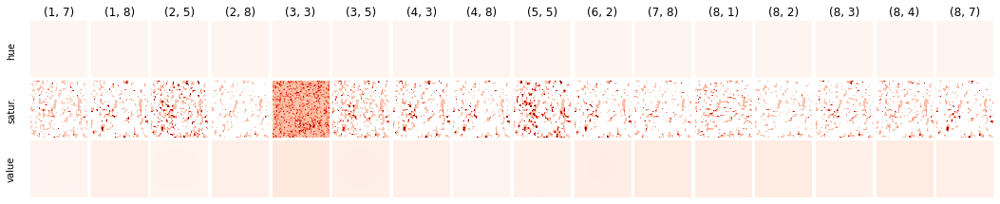

modules_dict.features7.1


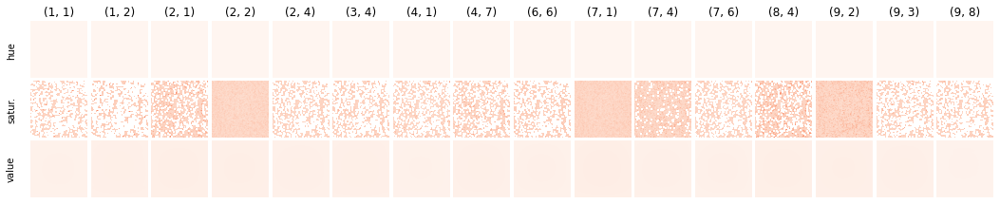

modules_dict.features9.1


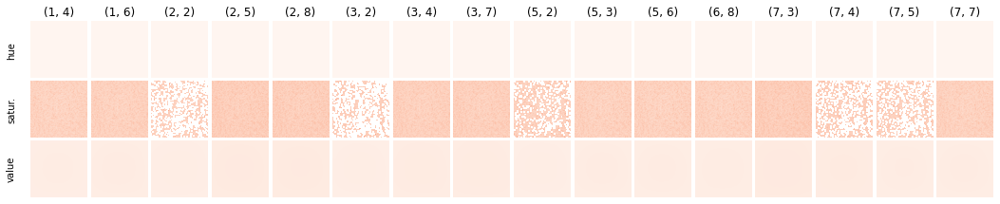

modules_dict.avgpool.3


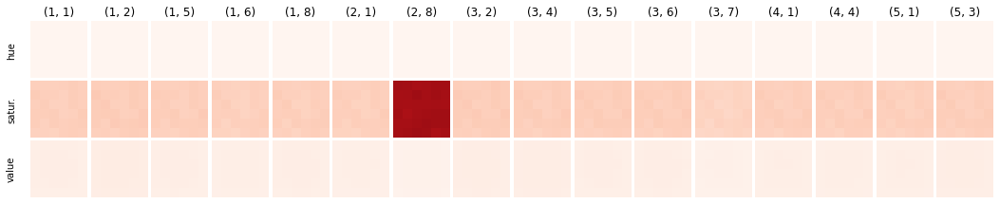

In [678]:
augmentation_set_number = 1

preparation.visualize.single_neuron_single_values_channeled_plot(
    augmentation_set_number=augmentation_set_number,
    values_name='var',
    values_func=sensitivity_analysis.preprocess_visualize.log_scale,
    **local_params_dict_1,
);

#### 1.3.2 Augmentation set #2

[[Back to subsection]](#1.3-Log-transformed-total-variances)

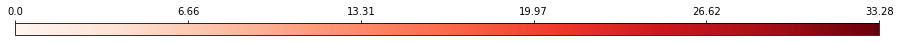

modules_dict.features2.2


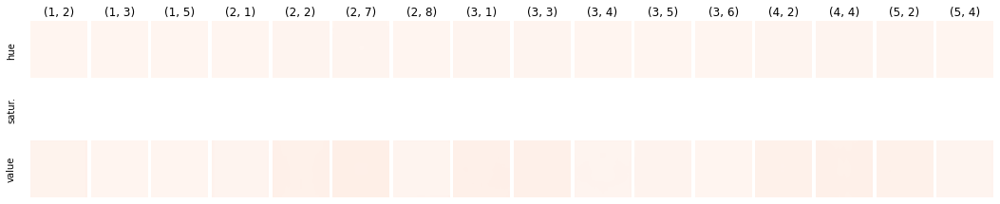

modules_dict.features5.2


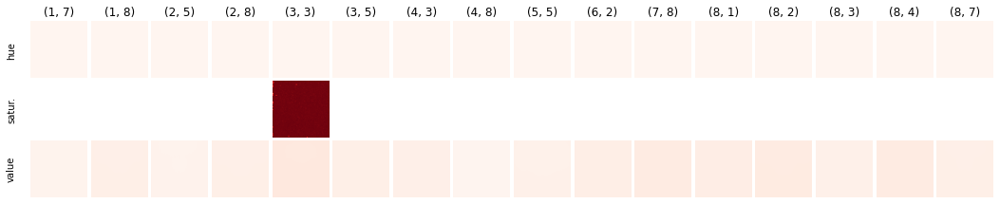

modules_dict.features7.1


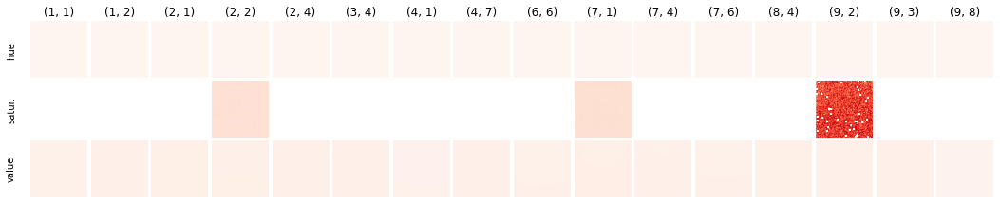

modules_dict.features9.1


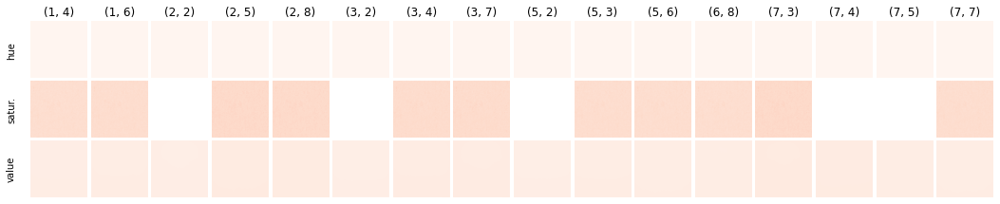

modules_dict.avgpool.3


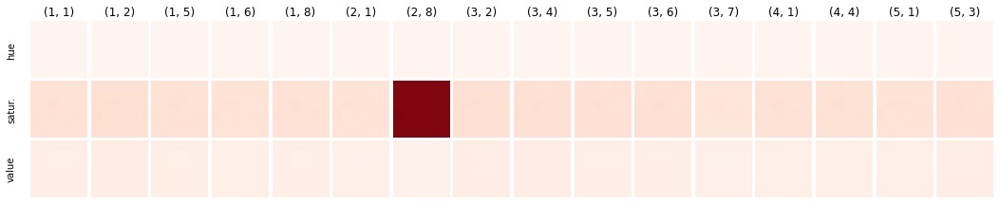

In [681]:
augmentation_set_number = 2

preparation.visualize.single_neuron_single_values_channeled_plot(
    augmentation_set_number=augmentation_set_number,
    values_name='var',
    values_func=sensitivity_analysis.preprocess_visualize.log_scale,
    **local_params_dict_1,
);

### 1.4 Log-transformed Coefficients of Variance

[[$\leftarrow$Prev.subsect.]](#1.3-Log-transformed-total-variances)$\quad$[[Back to section]](#1.-Sampling-scheme-1:-Summary-statistics)$\quad$

- [1.4.1 Augmentation set #1](#1.4.1-Augmentation-set-#1)
- [1.4.2 Augmentation set #2](#1.4.2-Augmentation-set-#2)

#### 1.4.1 Augmentation set #1

[[Back to subsection]](#1.4-Log-transformed-Coefficients-of-Variance)

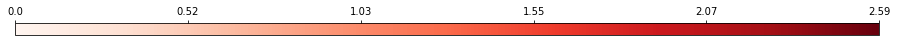

modules_dict.features2.2


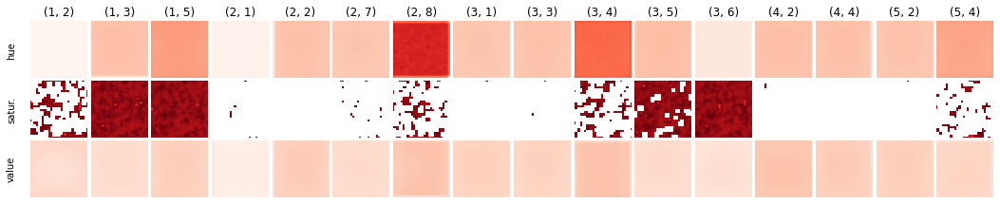

modules_dict.features5.2


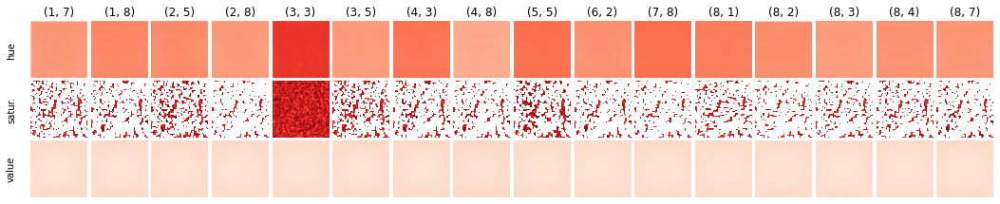

modules_dict.features7.1


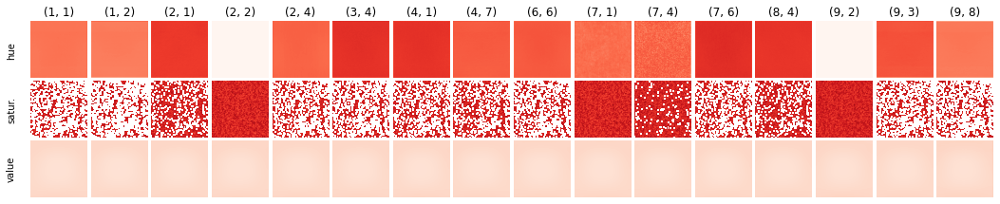

modules_dict.features9.1


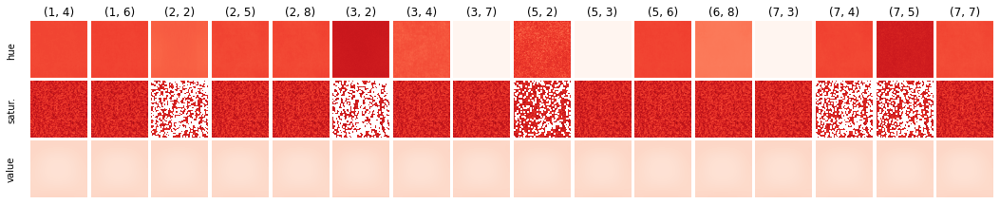

modules_dict.avgpool.3


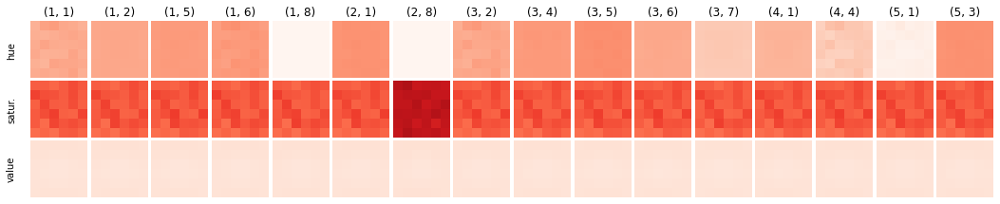

In [682]:
augmentation_set_number = 1

preparation.visualize.single_neuron_single_values_channeled_plot(
    augmentation_set_number=augmentation_set_number,
    values_name=('var', 'mean'),
    values_func=sensitivity_analysis.preprocess_visualize.compute_coef_var,
    **local_params_dict_1,
);

#### 1.4.2 Augmentation set #2

[[Back to subsection]](#1.4-Log-transformed-Coefficients-of-Variance)

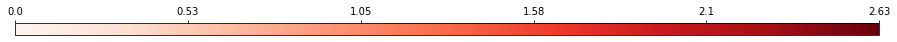

modules_dict.features2.2


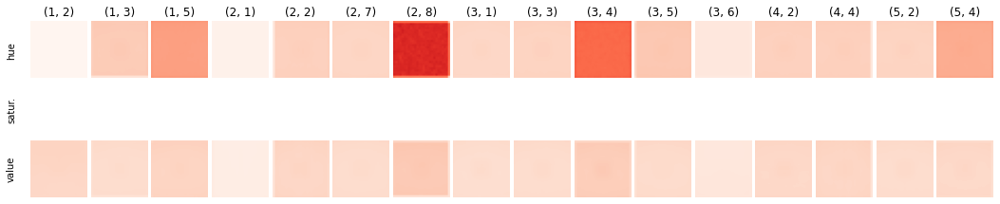

modules_dict.features5.2


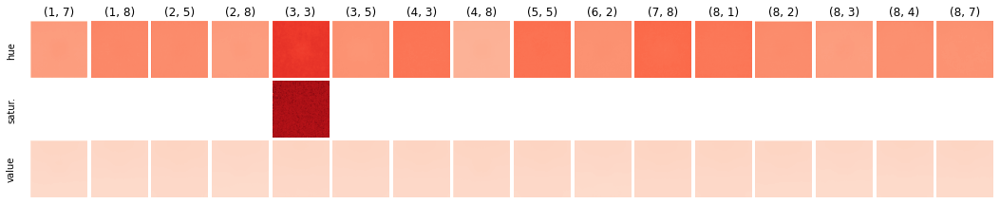

modules_dict.features7.1


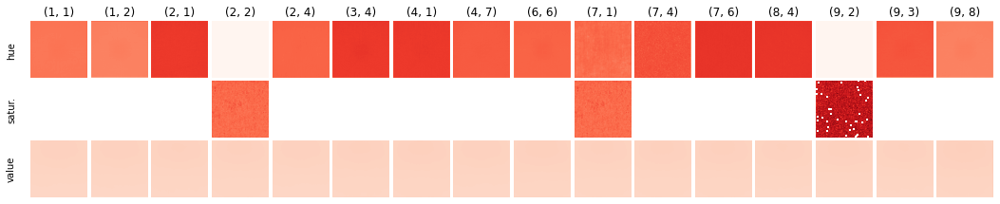

modules_dict.features9.1


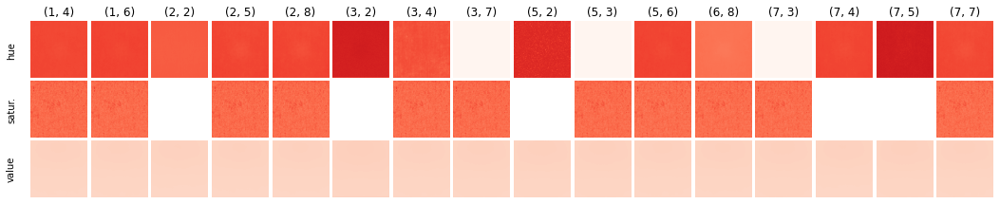

modules_dict.avgpool.3


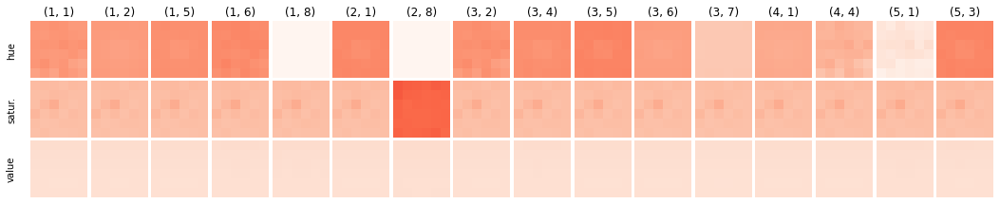

In [683]:
augmentation_set_number = 2

preparation.visualize.single_neuron_single_values_channeled_plot(
    augmentation_set_number=augmentation_set_number,
    values_name=('var', 'mean'),
    values_func=sensitivity_analysis.preprocess_visualize.compute_coef_var,
    **local_params_dict_1,
);

## 2. Sampling scheme 2: Summary statistics

[[$\leftarrow$ Prev.part]](#1.-Sampling-scheme-1:-Summary-statistics) $\qquad$ [[Back to top]](#Navigation) $\qquad$ [[Next part $\to$]](#3.-Aggregated-summary-statistics)

- [2.1 Evaluating variables needed to plot the results](#2.1-Evaluating-variables-needed-to-plot-the-results)
- [2.2 Log-transformed (modules of) mean values](#2.2-Log-transformed-(modules-of)-mean-values)
    - [2.2.1 Augmentation set #1](#2.2.1-Augmentation-set-#1)
    - [2.2.2 Augmentation set #2](#2.2.2-Augmentation-set-#2)
- [2.3 Log-transformed total variances](#2.3-Log-transformed-total-variances)
    - [2.3.1 Augmentation set #1](#2.3.1-Augmentation-set-#1)
    - [2.3.2 Augmentation set #2](#2.3.2-Augmentation-set-#2)
- [2.4 Coefficients of Variance](#2.4-Coefficients-of-Variance)
    - [2.4.1 Augmentation set #1](#2.4.1-Augmentation-set-#1)
    - [2.4.2 Augmentation set #2](#2.4.2-Augmentation-set-#2)


### 2.1 Evaluating variables needed to plot the results

$\quad$[[Back to section]](#2.-Sampling-scheme-2:-Summary-statistics)$\quad$[[Next subsect.$\to$]](#2.2-Log-transformed-(modules-of)-mean-values)

It is supposed that one has already run all necessary experiments and obtained the corresponding results.

In [686]:
local_params_dict_2 = {
    'values_fnm_prefix': config_dict_exp2_5["values_fnm_prefix"],
    'activations_dirname': activations_dirname,
    'dataset_part': config_dict_exp2_5["dataset_part"],
    'config_list': analysis_config_list,
    #'module_names': network_module_names,
    'ncols_max': 16,
    'ncols_orig': 8,
    'fig': None,
    'figsize': (20, 8),
    #gs=None,
    #gs_size=None,
    'show': True,
    'cmap': 'Reds',
    'vmin': 0.,
    'vmax': None
}

### 2.2 Log-transformed (modules of) mean values

[[$\leftarrow$Prev.subsect.]](#2.1-Evaluating-variables-needed-to-plot-the-results)$\quad$[[Back to section]](#2.-Sampling-scheme-2:-Summary-statistics)$\quad$[[Next subsect.$\to$]](#2.3-Log-transformed-total-variances)

- [2.2.1 Augmentation set #1](#2.2.1-Augmentation-set-#1)
- [2.2.2 Augmentation set #2](#2.2.2-Augmentation-set-#2)

#### 2.2.1 Augmentation set #1

[[Back to subsection]](#2.2-Log-transformed-(modules-of)-mean-values)

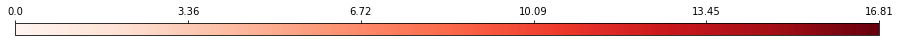

modules_dict.features2.2


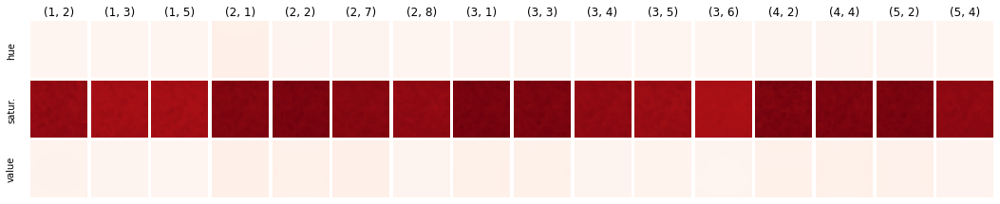

modules_dict.features5.2


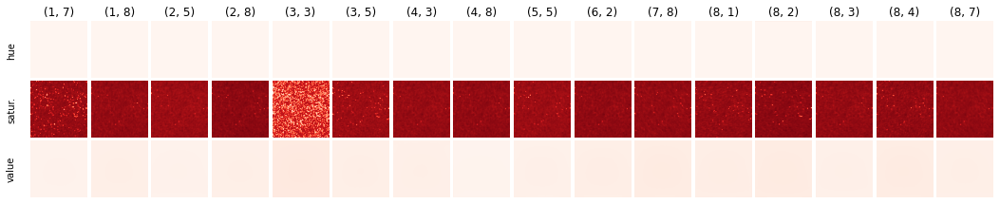

modules_dict.features7.1


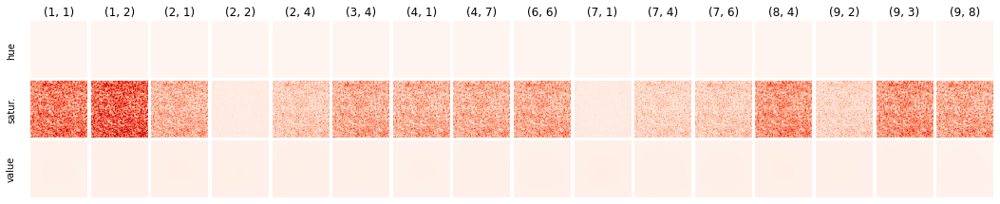

modules_dict.features9.1


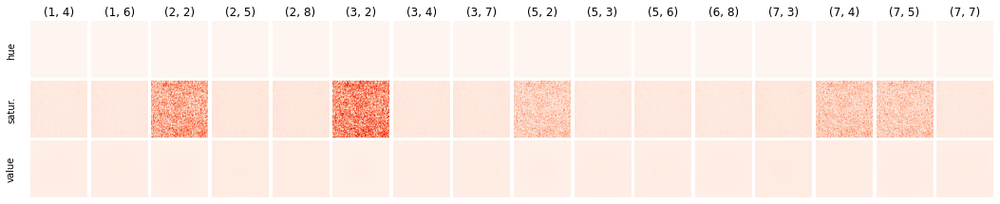

modules_dict.avgpool.3


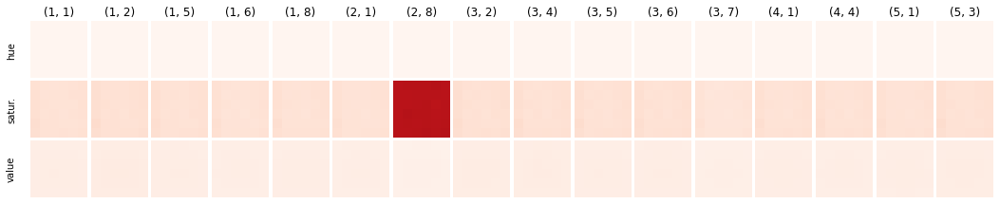

In [687]:
augmentation_set_number = 1

preparation.visualize.single_neuron_single_values_channeled_plot(
    augmentation_set_number=augmentation_set_number,
    values_name='means',
    values_func=sensitivity_analysis.preprocess_visualize.log_scale,
    **local_params_dict_2,
);

#### 2.2.2 Augmentation set #2

[[Back to subsection]](#2.2-Log-transformed-(modules-of)-mean-values)

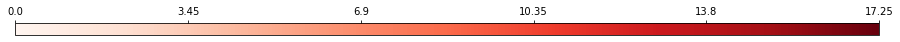

modules_dict.features2.2


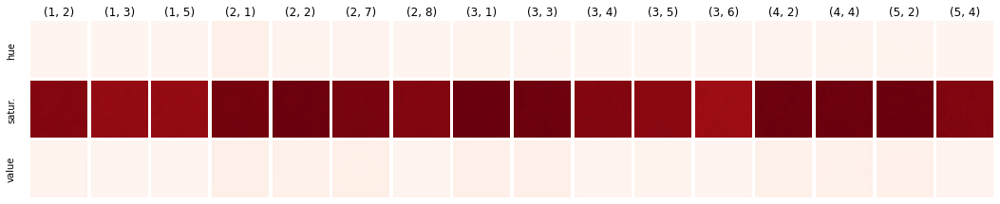

modules_dict.features5.2


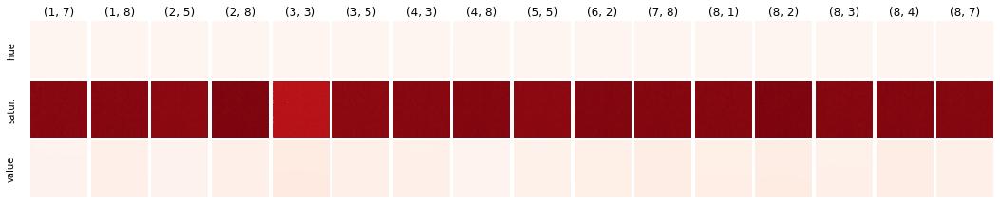

modules_dict.features7.1


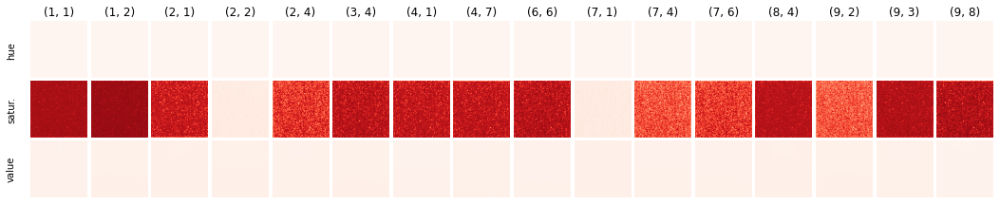

modules_dict.features9.1


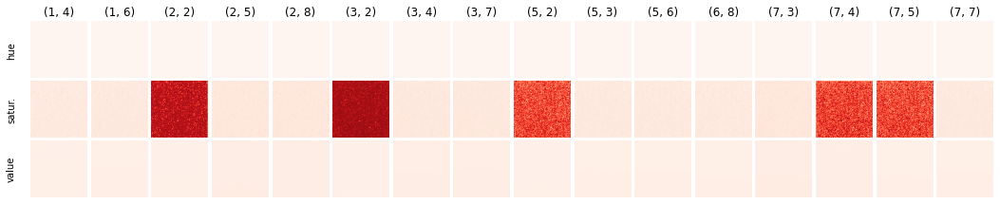

modules_dict.avgpool.3


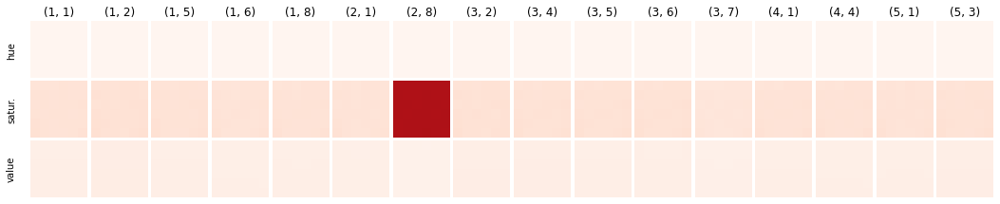

In [688]:
augmentation_set_number = 2

preparation.visualize.single_neuron_single_values_channeled_plot(
augmentation_set_number=augmentation_set_number,
    values_name='means',
    values_func=sensitivity_analysis.preprocess_visualize.log_scale,
    **local_params_dict_2,
);

### 2.3 Log-transformed total variances

[[$\leftarrow$Prev.subsect.]](#2.2-Log-transformed-(modules-of)-mean-values)$\quad$[[Back to section]](#2.-Sampling-scheme-2:-Summary-statistics)$\quad$[[Next subsect.$\to$]](#2.4-Coefficients-of-Variance)

- [2.3.1 Augmentation set #1](#2.3.1-Augmentation-set-#1)
- [2.3.2 Augmentation set #2](#2.3.2-Augmentation-set-#2)

#### 2.3.1 Augmentation set #1

[[Back to subsection]](#2.3-Log-transformed-total-variances)

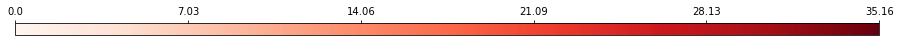

modules_dict.features2.2


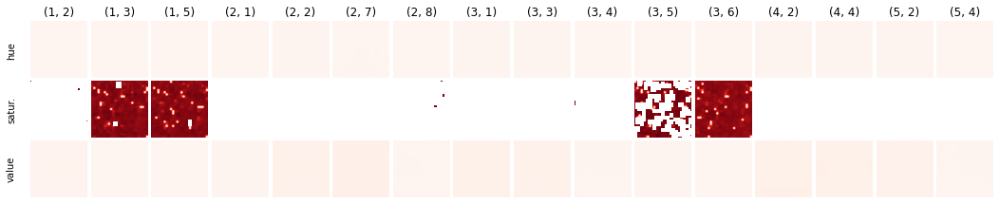

modules_dict.features5.2


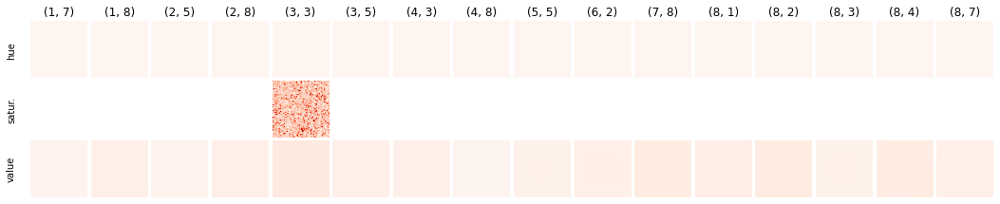

modules_dict.features7.1


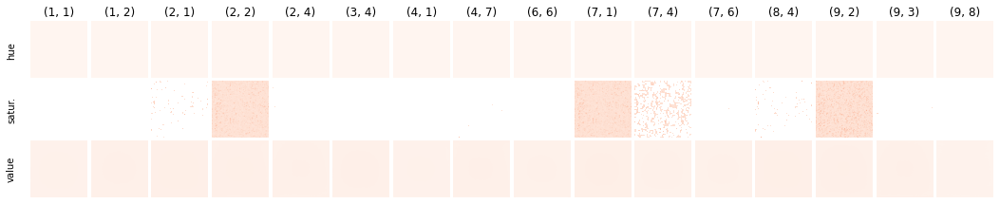

modules_dict.features9.1


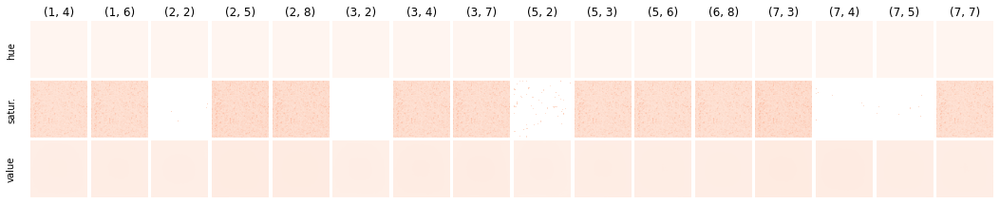

modules_dict.avgpool.3


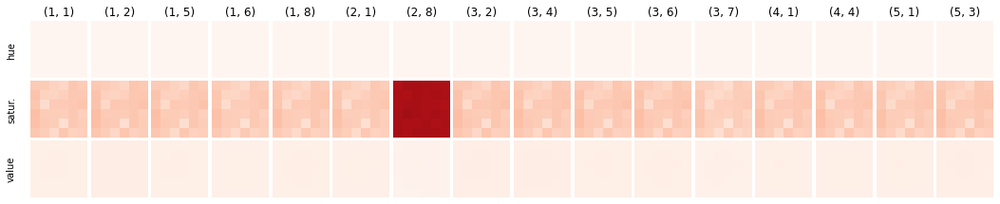

In [689]:
augmentation_set_number = 1

preparation.visualize.single_neuron_single_values_channeled_plot(
    augmentation_set_number=augmentation_set_number,
    values_name='shpv',
    values_func=sensitivity_analysis.preprocess_visualize.log_scale_sum,
    **local_params_dict_2,
);

#### 2.3.2 Augmentation set #2

[[Back to subsection]](#2.3-Log-transformed-total-variances)

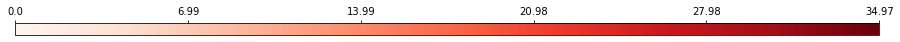

modules_dict.features2.2


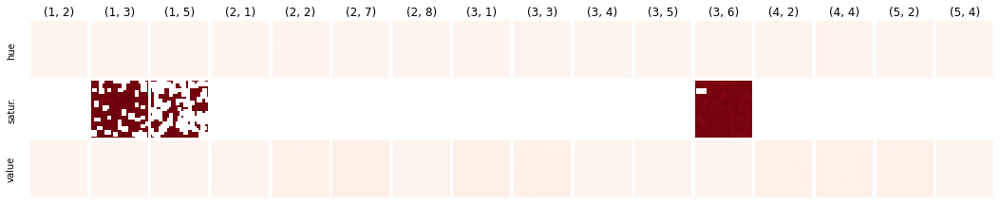

modules_dict.features5.2


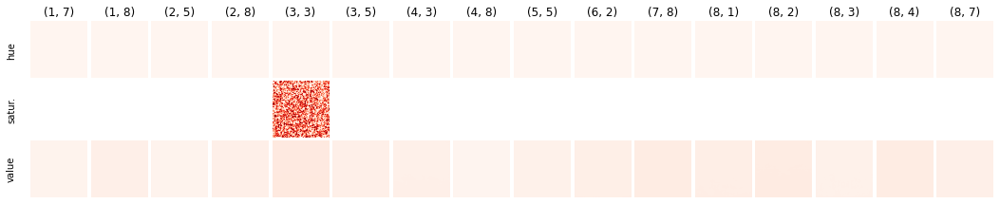

modules_dict.features7.1


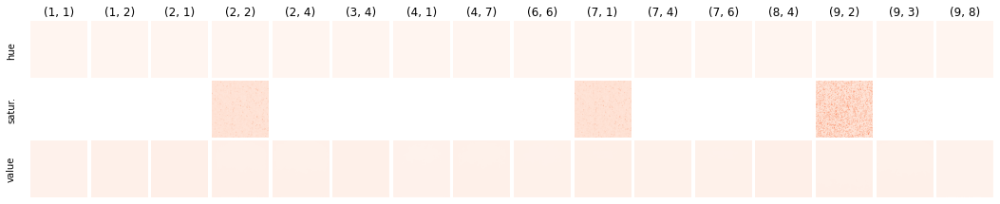

modules_dict.features9.1


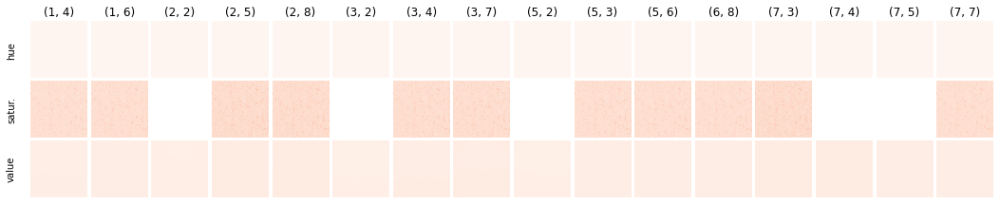

modules_dict.avgpool.3


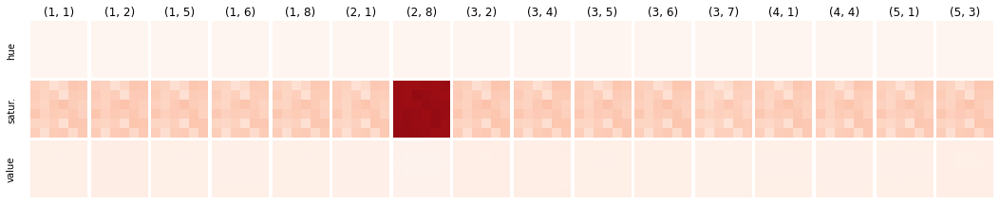

In [690]:
augmentation_set_number = 2

preparation.visualize.single_neuron_single_values_channeled_plot(
    augmentation_set_number=augmentation_set_number,
    values_name='shpv',
    values_func=sensitivity_analysis.preprocess_visualize.log_scale_sum,
    **local_params_dict_2,
);

### 2.4 Coefficients of Variance

[[$\leftarrow$Prev.subsect.]](#2.3-Log-transformed-total-variances)$\quad$[[Back to section]](#2.-Sampling-scheme-2:-Summary-statistics)$\quad$[[Next subsect.$\to$]](#2.5-Save-pictures)

- [2.4.1 Augmentation set #1](#2.4.1-Augmentation-set-#1)
- [2.4.2 Augmentation set #2](#2.4.2-Augmentation-set-#2)

#### 2.4.1 Augmentation set #1

[[Back to subsection]](#2.4-Coefficients-of-Variance)

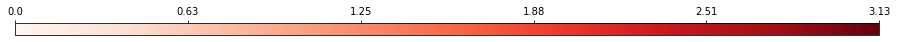

modules_dict.features2.2


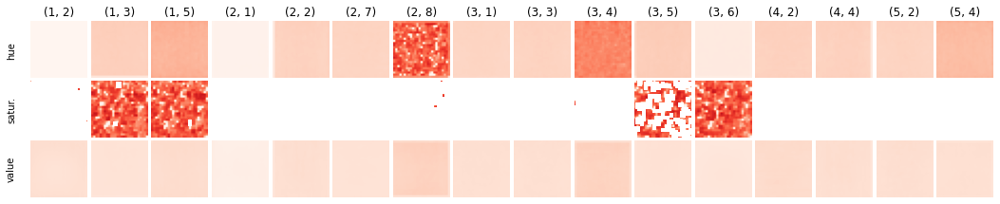

modules_dict.features5.2


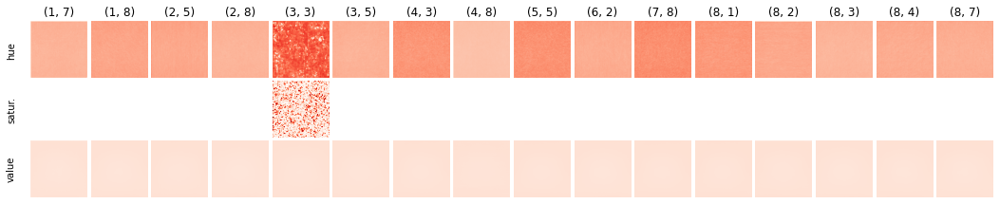

modules_dict.features7.1


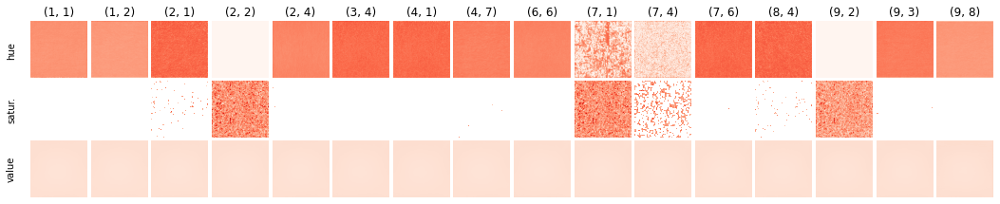

modules_dict.features9.1


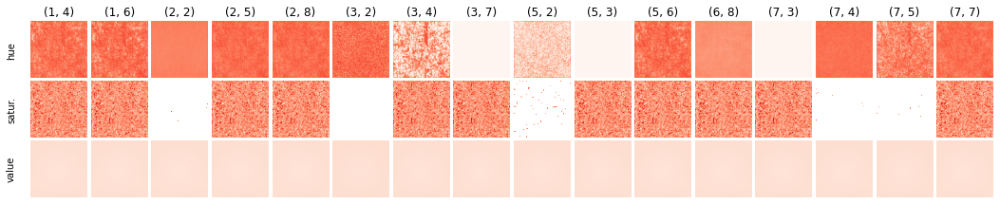

modules_dict.avgpool.3


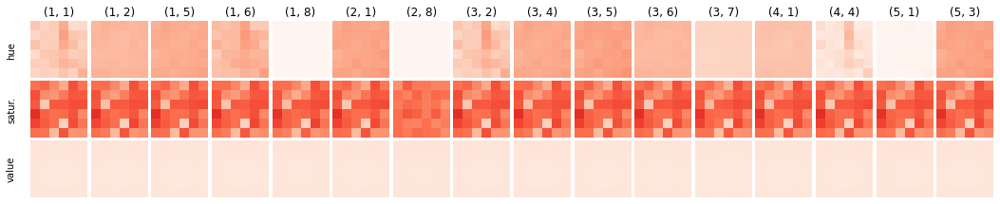

In [691]:
augmentation_set_number = 1

preparation.visualize.single_neuron_single_values_channeled_plot(
    augmentation_set_number=augmentation_set_number,
    values_name=('shpv', 'means'),
    values_func=sensitivity_analysis.preprocess_visualize.compute_shpv_coef_var,
    **local_params_dict_2,
);

#### 2.4.2 Augmentation set #2

[[Back to subsection]](#2.4-Coefficients-of-Variance)

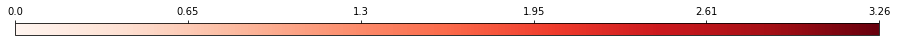

modules_dict.features2.2


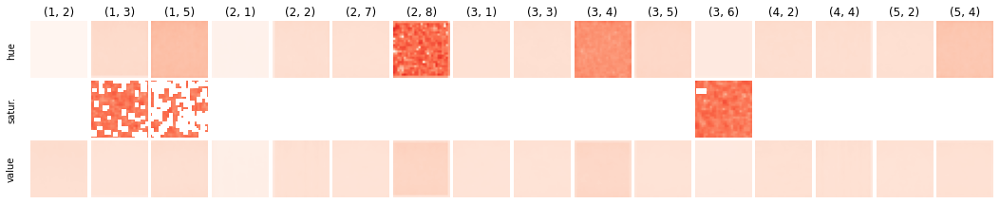

modules_dict.features5.2


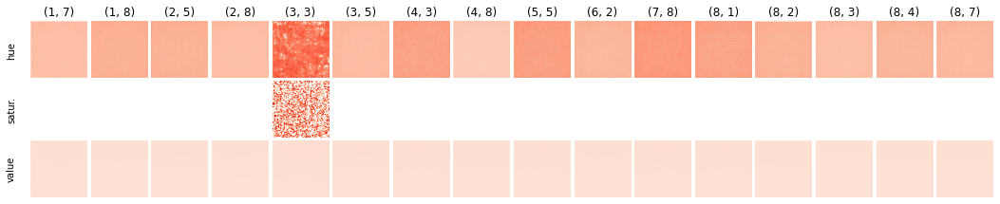

modules_dict.features7.1


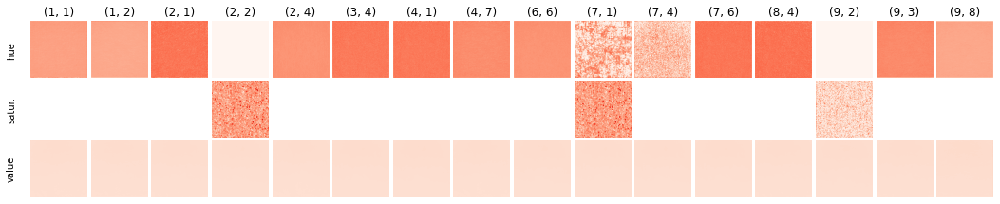

modules_dict.features9.1


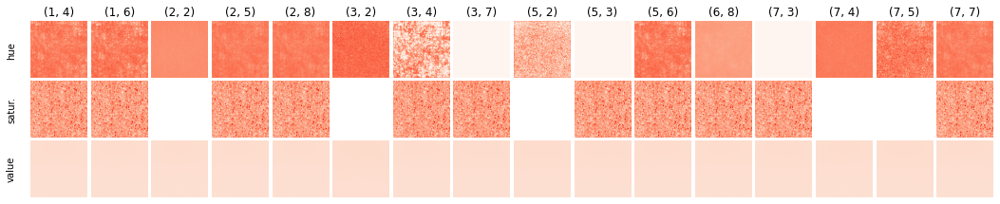

modules_dict.avgpool.3


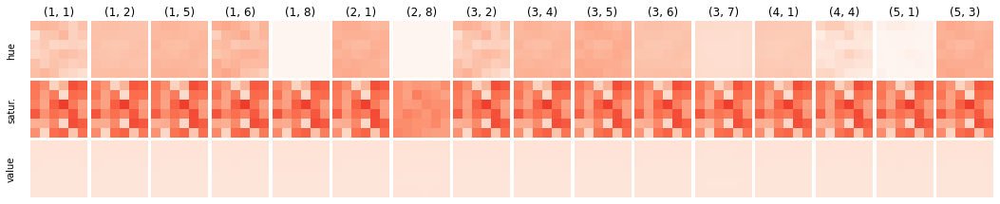

In [692]:
augmentation_set_number = 2

preparation.visualize.single_neuron_single_values_channeled_plot(
    augmentation_set_number=augmentation_set_number,
    values_name=('shpv', 'means'),
    values_func=sensitivity_analysis.preprocess_visualize.compute_shpv_coef_var,
    **local_params_dict_2,
);

## 3. Aggregated summary statistics

[[$\leftarrow$ Prev.part]](#2.-Sampling-scheme-2:-Summary-statistics) $\qquad$ [[Back to top]](#Navigation) $\qquad$ [[Next part $\to$]](#4.-Aggregated-sensitivity-values)


- [3.1 Initializing local variables](#3.1-Initializing-local-variables)
- [3.2 Log-transformed (modules of) mean values](#3.2-Log-transformed-(modules-of)-mean-values)
    - [3.2.1 Evaluating variables needed to plot the results](#3.2.1-Evaluating-variables-needed-to-plot-the-results)
    - [3.2.2 Plot the results (subset of neurons)](#3.2.2-Plot-the-results-(subset-of-neurons))
    - [3.2.3 Save the results](#3.2.3-Save-the-results)
- [3.3 Log-transformed total variances](#3.3-Log-transformed-total-variances)
    - [3.3.1 Evaluating variables needed to plot the results](#3.3.1-Evaluating-variables-needed-to-plot-the-results)
    - [3.3.2 Plot the results (subset of neurons)](#3.3.2-Plot-the-results-(subset-of-neurons))
    - [3.3.3 Save the results](#3.3.3-Save-the-results)
- [3.4 Log-transformed  Coefficients of Variance](#3.4-Log-transformed-Coefficients-of-Variance)
    - [3.4.1 Evaluating variables needed to plot the results](#3.4.1-Evaluating-variables-needed-to-plot-the-results)
    - [3.4.2 Plot the results (subset of neurons)](#3.4.2-Plot-the-results-(subset-of-neurons))
    - [3.4.3 Save the results](#3.4.3-Save-the-results)

### 3.1 Initializing local variables

$\quad$[[Back to section]](#3.-Aggregated-summary-statistics)$\quad$[[Next subsect.$\to$]](#3.2-Log-transformed-(modules-of)-mean-values)

In [828]:
values_funcs = {
    'sitv': {
        'mean': sensitivity_analysis.preprocess_visualize.log_scale,
        'var': sensitivity_analysis.preprocess_visualize.log_scale,
        ('var', 'mean'): sensitivity_analysis.preprocess_visualize.compute_coef_var,
    },
    'shpv': {
        'means': sensitivity_analysis.preprocess_visualize.log_scale,
        'shpv': sensitivity_analysis.preprocess_visualize.log_scale_sum,
        ('shpv', 'means'): sensitivity_analysis.preprocess_visualize.compute_shpv_coef_var,
    }
}

plotter_func_kwargs_dict = {
    'values_fnms_dict': values_fnms_dict,
    'activations_dirname': activations_dirname,
    'augmentation_set_numbers_list': augmentation_set_numbers_list, # 
    #'values_names_dict': values_names_dict,
    'values_funcs': values_funcs,
    'ncols_orig': ncols_orig,
}

plot_colorbar = True
figsize = (20, 8)
figsize_save = (5, 4)
cmap = 'Reds'
colblocks_per_row = 4
N_neurons = 8
dataset_part = None

agg_stat_imsave_path = os.path.join(
    activations_dirname,
    network_name,
    'aggregated_summary_stats'
)

### 3.2 Log-transformed (modules of) mean values

[[$\leftarrow$Prev.subsect.]](#3.1-Initializing-local-variables)$\quad$[[Back to section]](#3.-Aggregated-summary-statistics)$\quad$[[Next subsect.$\to$]](#3.3-Log-transformed-total-variances)

- [3.2.1 Evaluating variables needed to plot the results](#3.2.1-Evaluating-variables-needed-to-plot-the-results)
- [3.2.2 Plot the results (subset of neurons)](#3.2.2-Plot-the-results-(subset-of-neurons))
- [3.2.3 Save the results](#3.2.3-Save-the-results)

#### 3.2.1 Evaluating variables needed to plot the results

[[Back to subsection]](#3.2-Log-transformed-(modules-of)-mean-values)

In [813]:
### means

means_values_names_dict = {
    'sitv': ['mean'],
    'shpv': ['means'],
}

means_vmin, means_vmax = preparation.visualize.get_global_vmin_vmax(
    values_fnms_dict,
    activations_dirname,
    augmentation_set_numbers_list,
    network_module_names,
    dataset_part,
    analysis_config_list,
    means_values_names_dict,
    values_funcs=values_funcs,
    slice_num=None,
)

#### 3.2.2 Plot the results (subset of neurons)

[[Back to subsection]](#3.2-Log-transformed-(modules-of)-mean-values)

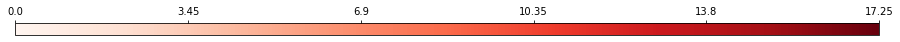


		 features2


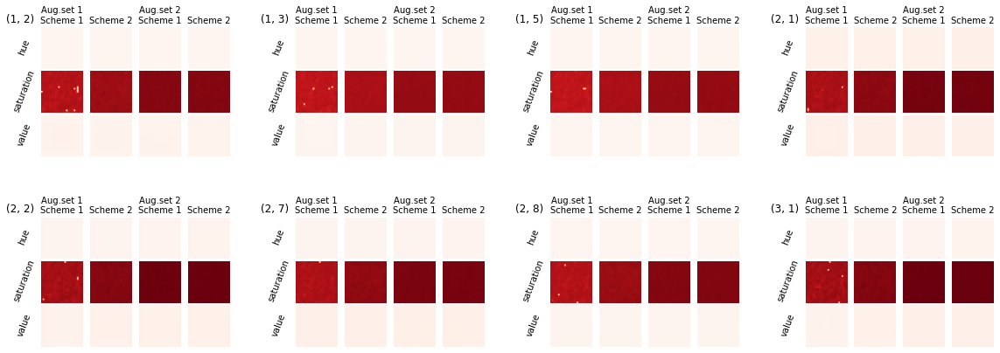


		 features5


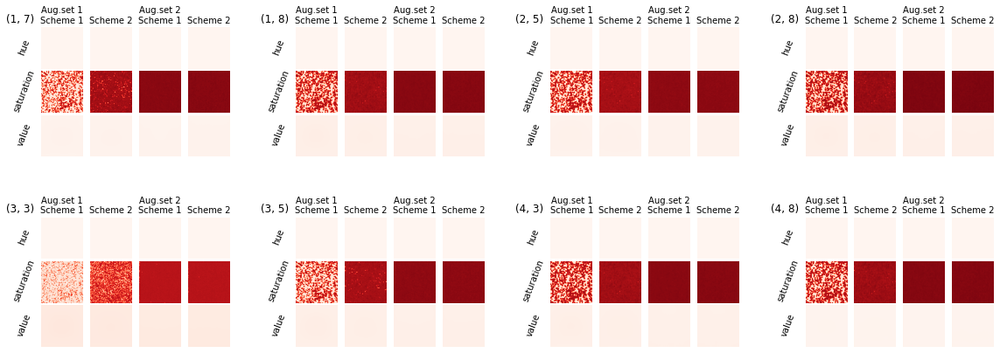


		 features7


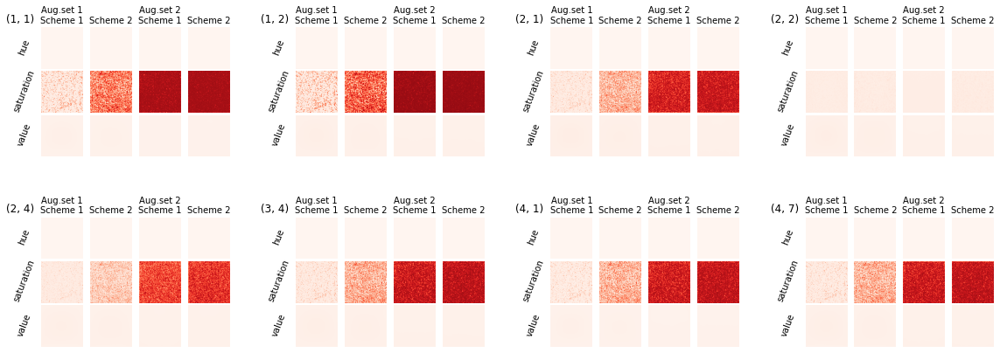


		 features9


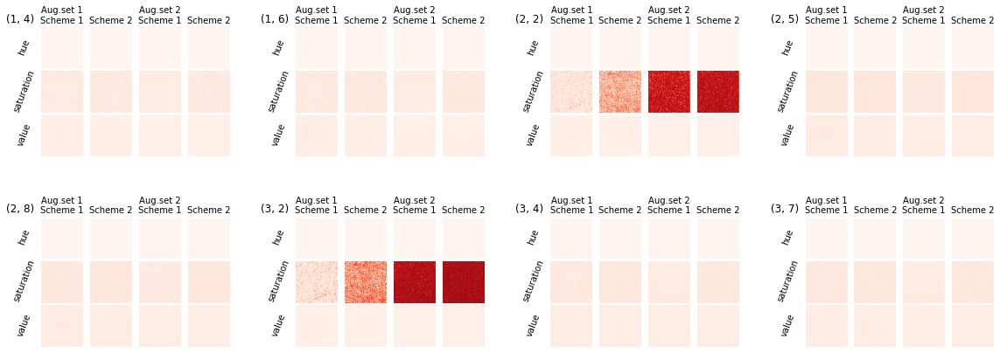


		 avgpool


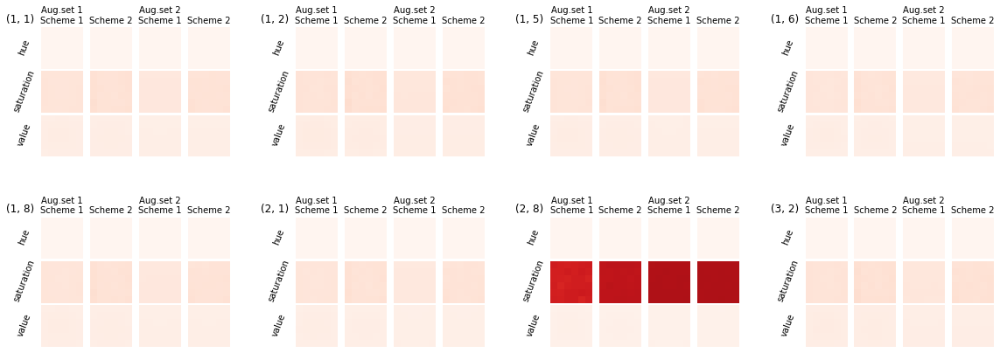

In [814]:
plotter_func_kwargs_dict['values_names_dict'] = means_values_names_dict

preparation.visualize.multi_neuron_block_plot(
    analysis_config_list,
    preparation.visualize.single_neuron_multiple_values_channeled_plot,
    plotter_func_kwargs_dict,
    colblocks_per_row,
    N_neurons,
    vmin=0.,
    vmax=means_vmax,
    cmap=cmap,
    figsize=figsize,
    plot_colorbar=plot_colorbar,
)

#### 3.2.3 Save the results

[[Back to subsection]](#3.2-Log-transformed-(modules-of)-mean-values)

In [ ]:
plotter_func_kwargs_dict['values_names_dict'] = means_values_names_dict
preparation.visualize.multi_neuron_block_save(
    analysis_config_list,
    preparation.visualize.single_neuron_multiple_values_channeled_plot,
    plotter_func_kwargs_dict,
    save_path=os.path.join(agg_stat_imsave_path, 'means'),
    save_filename_base='Mean',
    vmin=0.,
    vmax=means_vmax,
    cmap=cmap,
    figsize=figsize_save,
    plot_colorbar=plot_colorbar,
);

### 3.3 Log-transformed total variances

[[$\leftarrow$Prev.subsect.]](#3.2-Log-transformed-(modules-of)-mean-values)$\quad$[[Back to section]](#3.-Aggregated-summary-statistics)$\quad$[[Next subsect.$\to$]](#3.4-Log-transformed-Coefficients-of-Variance)

- [3.3.1 Evaluating variables needed to plot the results](#3.3.1-Evaluating-variables-needed-to-plot-the-results)
- [3.3.2 Plot the results (subset of neurons)](#3.3.2-Plot-the-results-(subset-of-neurons))
- [3.3.3 Save the results](#3.3.3-Save-the-results)

#### 3.3.1 Evaluating variables needed to plot the results

[[Back to subsection]](#3.3-Log-transformed-total-variances)

In [815]:
### vars

vars_values_names_dict = {
    'sitv': ['var'],
    'shpv': ['shpv'],
}

vars_vmin, vars_vmax = preparation.visualize.get_global_vmin_vmax(
    values_fnms_dict,
    activations_dirname,
    augmentation_set_numbers_list,
    network_module_names,
    dataset_part,
    analysis_config_list,
    vars_values_names_dict,
    values_funcs=values_funcs,
    slice_num=None,
)

#### 3.3.2 Plot the results (subset of neurons)

[[Back to subsection]](#3.3-Log-transformed-total-variances)

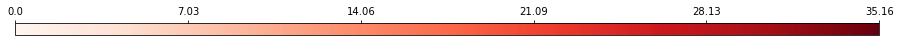


		 features2


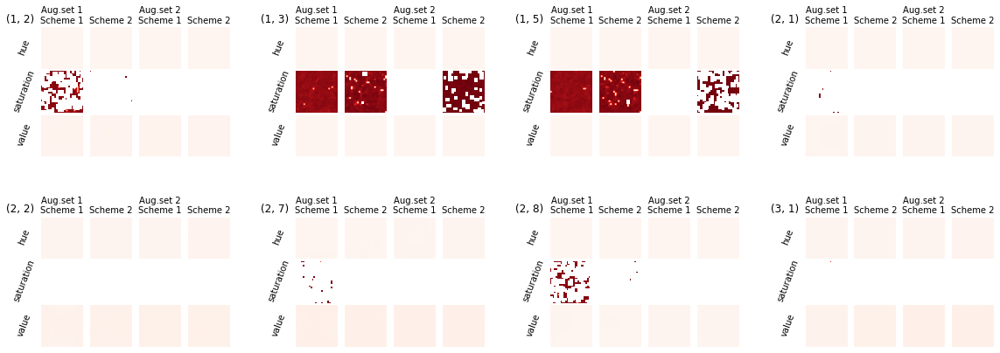


		 features5


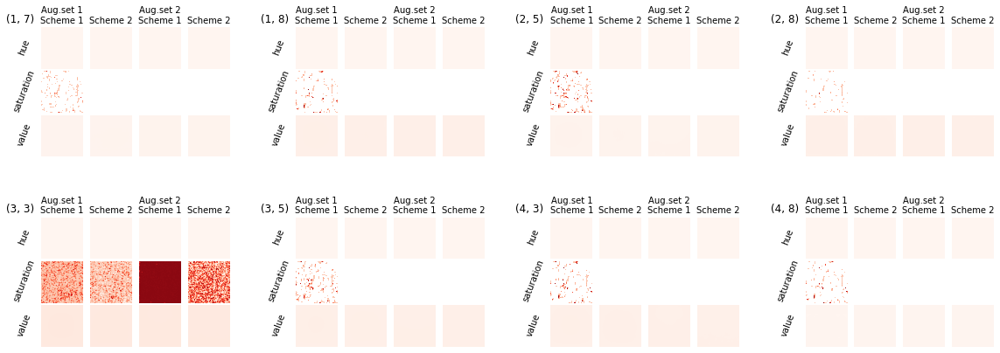


		 features7


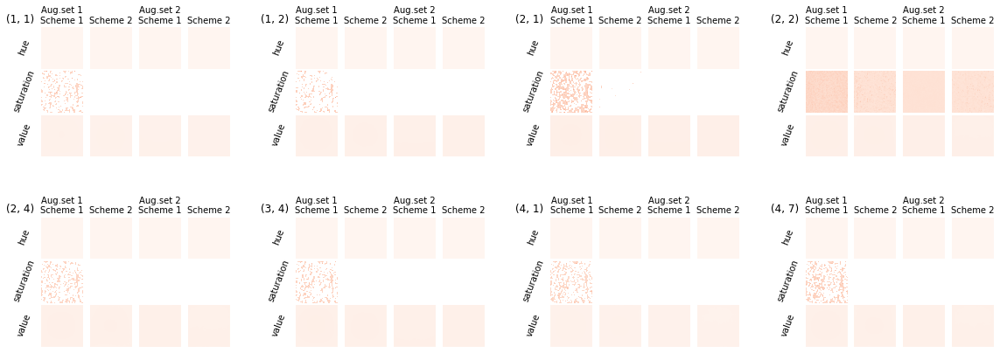


		 features9


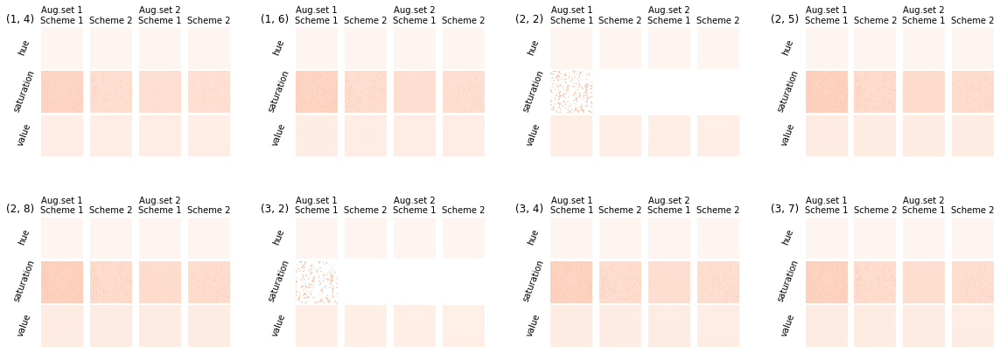


		 avgpool


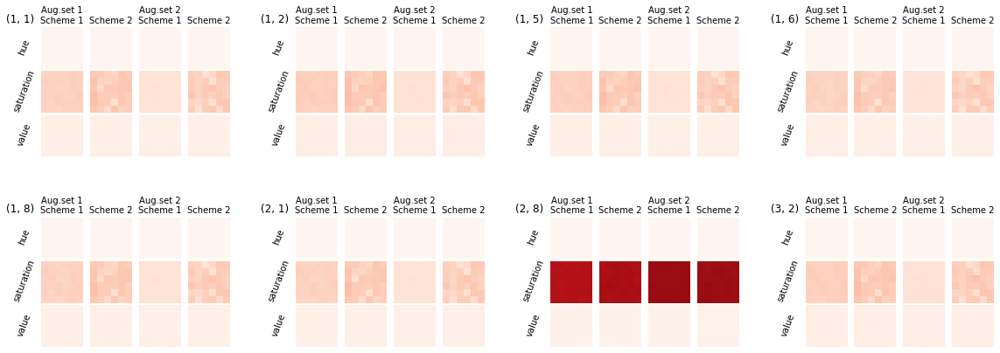

In [816]:
plotter_func_kwargs_dict['values_names_dict'] = vars_values_names_dict

preparation.visualize.multi_neuron_block_plot(
    analysis_config_list,
    preparation.visualize.single_neuron_multiple_values_channeled_plot,
    plotter_func_kwargs_dict,
    colblocks_per_row,
    N_neurons,
    vmin=0.,
    vmax=vars_vmax,
    cmap=cmap,
    figsize=figsize,
    plot_colorbar=plot_colorbar,
)

#### 3.3.3 Save the results

[[Back to subsection]](#3.3-Log-transformed-total-variances)

In [ ]:
plotter_func_kwargs_dict['values_names_dict'] = vars_values_names_dict
preparation.visualize.multi_neuron_block_save(
    analysis_config_list,
    preparation.visualize.single_neuron_multiple_values_channeled_plot,
    plotter_func_kwargs_dict,
    save_path=os.path.join(agg_stat_imsave_path, 'vars'),
    save_filename_base='Var',
    vmin=0.,
    vmax=vars_vmax,
    cmap=cmap,
    figsize=figsize_save,
    plot_colorbar=plot_colorbar,
)

### 3.4 Log-transformed Coefficients of Variance

[[$\leftarrow$Prev.subsect.]](#3.3-Log-transformed-total-variances)$\quad$[[Back to section]](#3.-Aggregated-summary-statistics)$\quad$


- [3.4.1 Evaluating variables needed to plot the results](#3.4.1-Evaluating-variables-needed-to-plot-the-results)
- [3.4.2 Plot the results (subset of neurons)](#3.4.2-Plot-the-results-(subset-of-neurons))
- [3.4.3 Save the results](#3.4.3-Save-the-results)

#### 3.4.1 Evaluating variables needed to plot the results

[[Back to subsection]](#3.4-Log-transformed-Coefficients-of-Variance)

In [ ]:
### covs

covs_values_names_dict = {
    'sitv': [('var', 'mean')],
    'shpv': [('shpv', 'means')],
}

cov_vmin, cov_vmax = preparation.visualize.get_global_vmin_vmax(
    values_fnms_dict,
    activations_dirname,
    augmentation_set_numbers_list,
    network_module_names,
    dataset_part,
    analysis_config_list,
    covs_values_names_dict,
    values_funcs=values_funcs,
    slice_num=None,
)

#### 3.4.2 Plot the results (subset of neurons)

[[Back to subsection]](#3.4-Log-transformed-Coefficients-of-Variance)

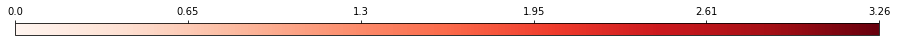


		 features2


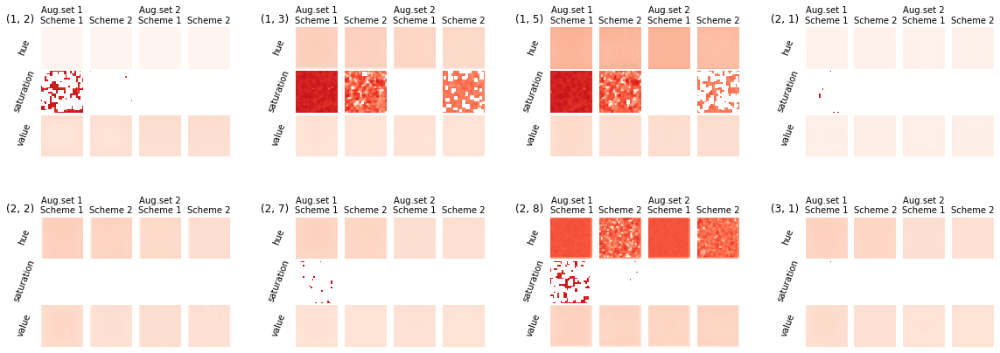


		 features5


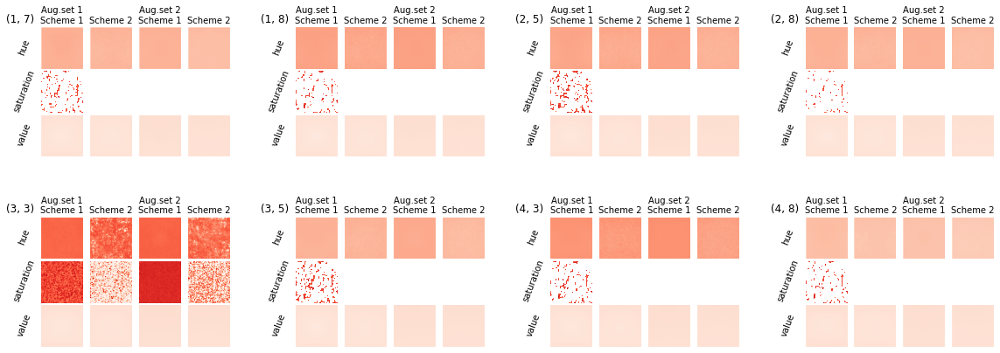


		 features7


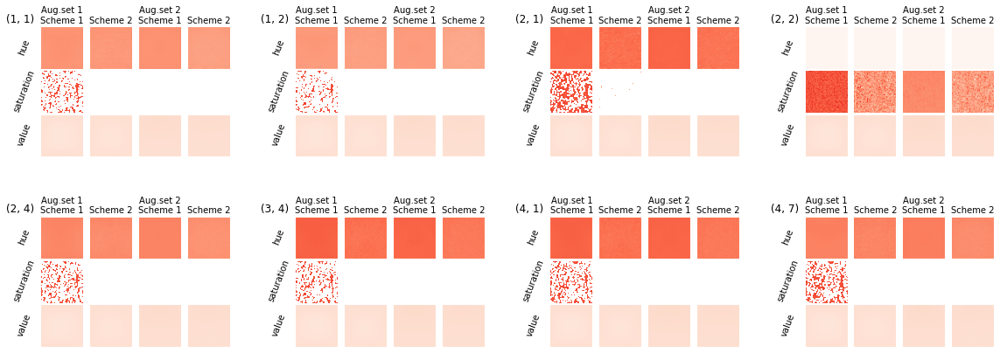


		 features9


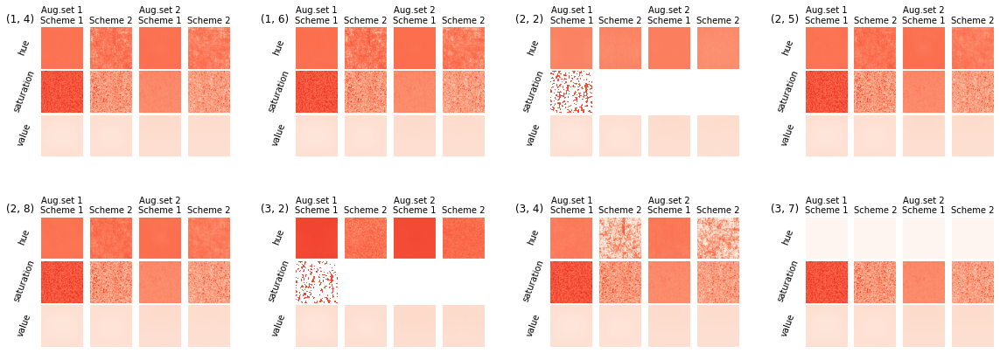


		 avgpool


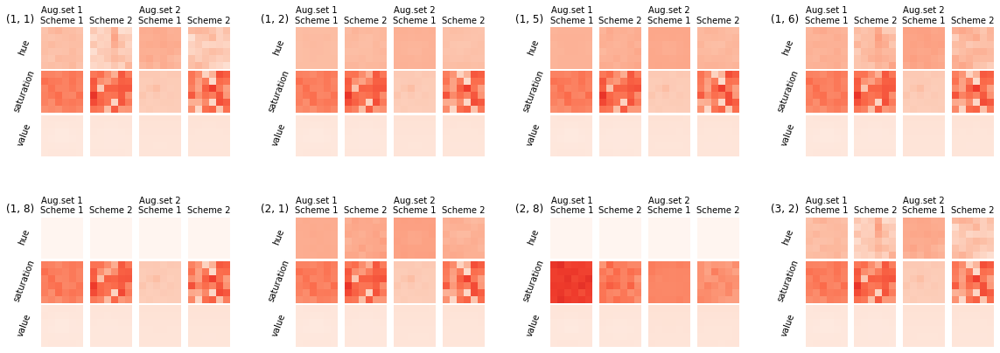

In [811]:
plotter_func_kwargs_dict['values_names_dict'] = covs_values_names_dict

preparation.visualize.multi_neuron_block_plot(
    analysis_config_list,
    preparation.visualize.single_neuron_multiple_values_channeled_plot,
    plotter_func_kwargs_dict,
    colblocks_per_row,
    N_neurons,
    vmin=0.,
    vmax=cov_vmax,
    cmap=cmap,
    figsize=figsize,
    plot_colorbar=plot_colorbar,
)

#### 3.4.3 Save the results

[[Back to subsection]](#3.4-Log-transformed-Coefficients-of-Variance)

In [ ]:
plotter_func_kwargs_dict['values_names_dict'] = covs_values_names_dict
preparation.visualize.multi_neuron_block_save(
    analysis_config_list,
    preparation.visualize.single_neuron_multiple_values_channeled_plot,
    plotter_func_kwargs_dict,
    save_path=os.path.join(agg_stat_imsave_path, 'covs'),
    save_filename_base='CoV',
    vmin=0.,
    vmax=cov_vmax,
    cmap=cmap,
    figsize=figsize_save,
    plot_colorbar=plot_colorbar,
)

## 4. Aggregated sensitivity values

[[$\leftarrow$ Prev.part]](#3.-Aggregated-summary-statistics) $\qquad$ [[Back to top]](#Navigation) $\qquad$

- [4.1 Evaluating variables needed to plot the results](#4.1-Evaluating-variables-needed-to-plot-the-results)
- [4.2 Plot the results (subset of neurons)](#4.2-Plot-the-results-(subset-of-neurons))
- [4.3 Save the results](#4.3-Save-the-results)

### 4.1 Evaluating variables needed to plot the results

$\quad$[[Back to section]](#4.-Aggregated-sensitivity-values)$\quad$[[Next subsect.$\to$]](#4.2-Plot-the-results-(subset-of-neurons))

In [950]:
agg_sens_values_names_dict = {
    'shpv': ['shpv'],
    'si': ['si', 'siT'],
}

shpv_group_indices_dict = {}
for augmentation_set_number in augmentation_set_numbers_list:
    shpv_group_indices_dict[
        augmentation_set_number
    ] = sensitivity_analysis.augmentation_setting.get_group_variables_indices(
        augmentation_set_number,
        use_permutation_variable=True,
        use_class_variable=True,
        use_partition_variable=True
    )

plotter_func_kwargs_dict = {
    'values_fnms_dict': values_fnms_dict,
    'activations_dirname': activations_dirname,
    'augmentation_set_numbers_list': augmentation_set_numbers_list, # 
    'values_names_dict': agg_sens_values_names_dict,
    'ncols_orig': ncols_orig,
    'shpv_group_indices_dict': shpv_group_indices_dict
}
plot_colorbar = True
figsize = (30, 27)
figsize_save = (14, 8)
cmap = 'Reds'
colblocks_per_row = 2
N_neurons = 4

agg_sav_imsave_path = os.path.join(
    activations_dirname,
    network_name,
    'aggregated_sensitivity_values'
)

### 4.2 Plot the results (subset of neurons)

[[$\leftarrow$Prev.subsect.]](#4.1-Evaluating-variables-needed-to-plot-the-results)$\quad$[[Back to section]](#4.-Aggregated-sensitivity-values)$\quad$[[Next subsect.$\to$]](#4.3-Save-the-results)


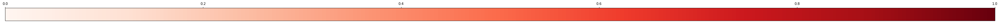


		 features2


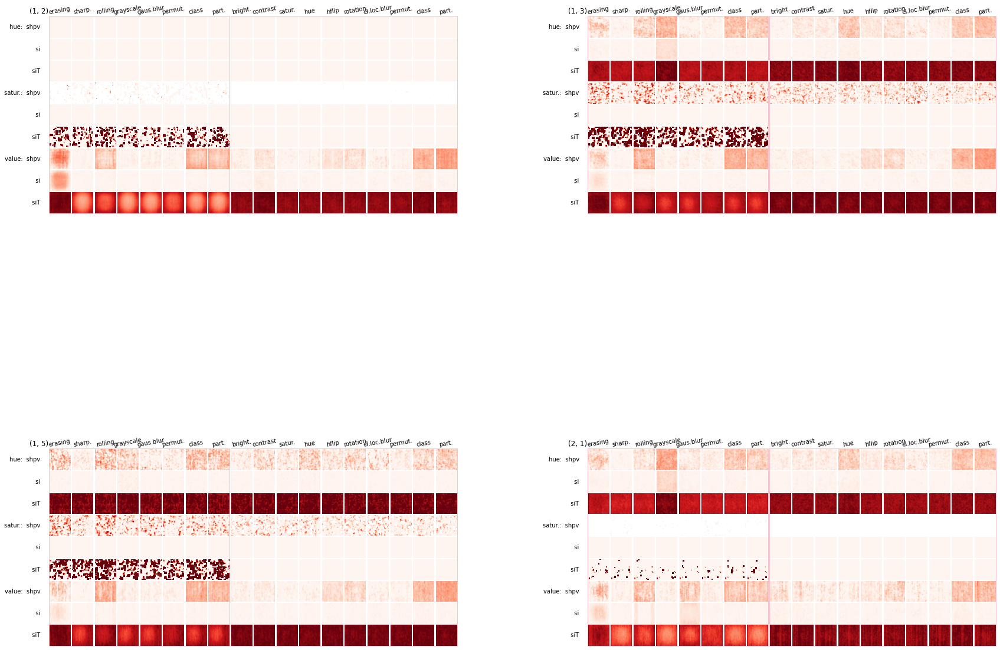


		 features5


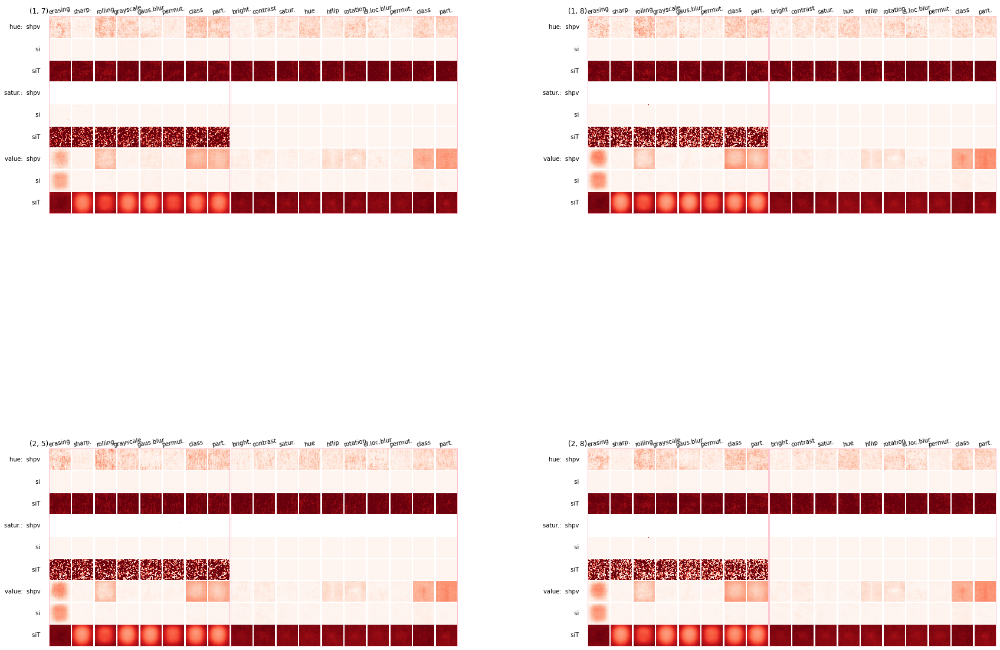


		 features7


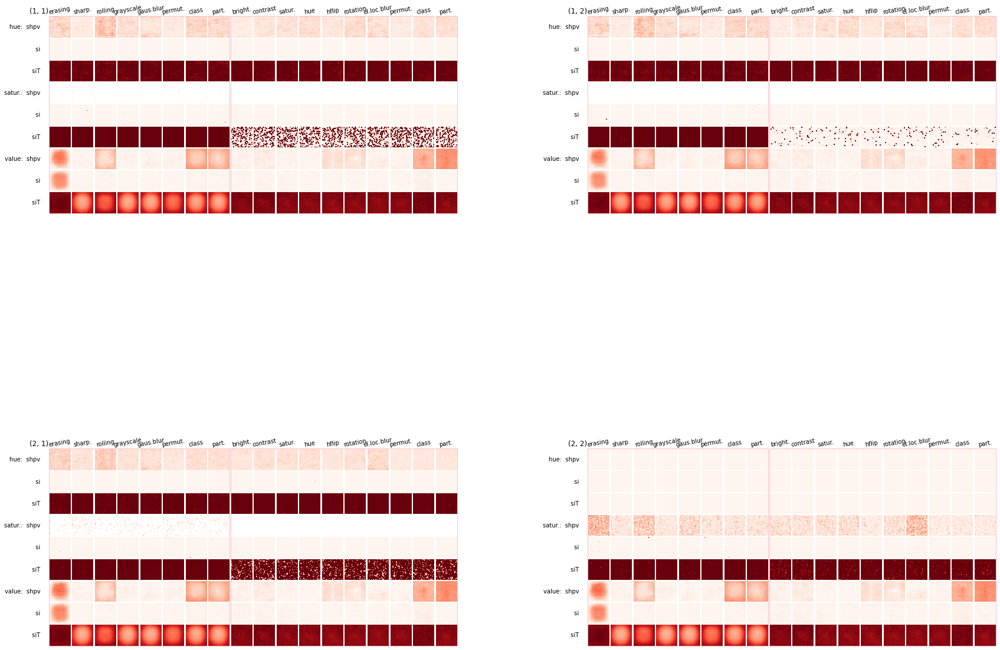


		 features9


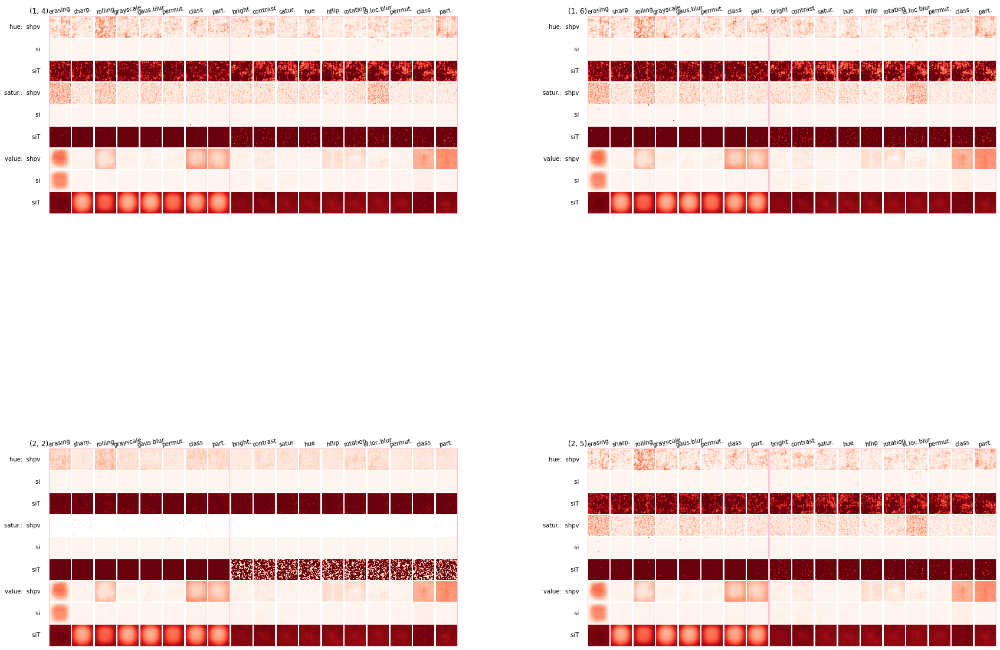


		 avgpool


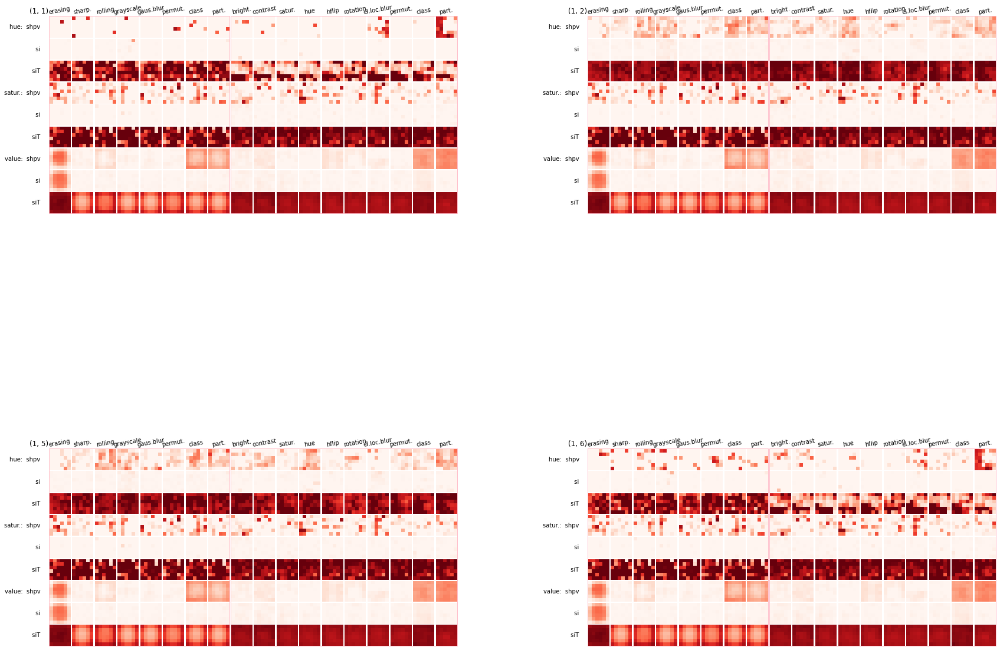

In [949]:
preparation.visualize.multi_neuron_block_plot(
    analysis_config_list,
    preparation.visualize.single_neuron_multiple_values_channeled_plot_2,
    plotter_func_kwargs_dict,
    colblocks_per_row,
    N_neurons,
    vmin=0.,
    vmax=1,
    cmap=cmap,
    figsize=figsize,
    plot_colorbar=plot_colorbar,
)


### 4.3 Save the results

[[$\leftarrow$Prev.subsect.]](#4.2-Plot-the-results-(subset-of-neurons))$\quad$[[Back to section]](#4.-Aggregated-sensitivity-values)$\quad$

In [ ]:
preparation.visualize.multi_neuron_block_save(
    analysis_config_list,
    preparation.visualize.single_neuron_multiple_values_channeled_plot_2,
    plotter_func_kwargs_dict,
    save_path=agg_sav_imsave_path,
    save_filename_base='agg_sensitivity_values',
    vmin=0.,
    vmax=1.,
    cmap=cmap,
    figsize=figsize_save,
    plot_colorbar=plot_colorbar,
)